In [104]:
import pandas as pd
import os
import yaml
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from scipy.stats import ecdf, mannwhitneyu
from statsmodels.stats.weightstats import ttest_ind

from utils import *

In [105]:
config = yaml.safe_load(open('/Users/ursic/PhD/Projects/1_DataAnalysis_zebrafish/beads_in_zebrafish/magnetic_tweezers_SD/config.yml'))

filepath_measurements_info = config['filepath_measurements_info']
dir_plots = os.path.join(config['dir_parent'], '3_plots')  # Folder for saving plots
dir_analysis = os.path.join(config['dir_parent'], '2_analysis')  # Folder for saving analysis results
recalculate = config['recalculate']  # Whether to recalculate measurements if they already exist
pix_size = config['pix_size'] 
dt = config['dt']  # Time step in seconds

force_ranges = config['force_ranges']  # Force ranges for averaging curves
subtract_backgroung = config['subtract_background']  # Whether to subtract background from displacement
mt_codes = config['mt_codes']
conditions = config['conditions']

creep_only = False
if config['fit_type'] == 'creep jeff':
    creep_only = True  # If the fit type is 'creep jeff', we only plot creep curves
    
creep_only_label = '_only_creep' if creep_only else ''

displacement_column = 'CORRECTED DISPLACEMENT [um]' if subtract_backgroung else 'DISPLACEMENT [um]'  # Use the original displacement, not corrected
subtr_bck_label = 'subtr_bck' if subtract_backgroung else 'no_subtr_bck'

In [106]:
# load data
df_results_all = pd.read_csv(dir_plots + f'/results/results_material_properties_{subtr_bck_label}.csv')
df_results_all.sort_values(by='MT_STATUS', ascending=False, inplace=True)
df_results_all.head(10)

,Unnamed: 0,file,EXPERIMENT,EMBRYO,TRACK_ID,PULSE_NUMBER,MT_STATUS,AVG_FORCE,k,eta_1,...,R_SQUARED_smooth,R_SQUARED_fit,rising_dif,relaxing_dif,rising_dif_norm,rising_dif_norm_inverse,relative_dif,tau_r,a,elastic_viscous_ratio
504,504,20240621_s02p02t03_2_5sON_15sOFF_125-600_spots...,20240621s02p02t03,20240621s02p02,2,7,y,54.964868,78.006280,56.062286,...,0.974438,0.941082,2.219253,-0.284849,0.040376,24.767283,0.128354,0.359345,0.311036,0.451455
643,643,20240705_s03p01t02_2_5sON_15sOFF_spots_extende...,20240705s03p01t02,20240705s03p01,0,10,y,24.594918,9.268360,28.257541,...,0.986618,0.885943,2.195749,-2.134905,0.089277,11.201152,0.972290,1.524409,0.918068,11.205220
633,633,20240705_s03p01t02_2_5sON_15sOFF_spots_extende...,20240705s03p01t02,20240705s03p01,3,14,y,32.507799,34.395230,48.249018,...,0.982049,0.554748,0.841681,-1.276336,0.025892,38.622483,1.516414,0.701391,0.999839,6199.561121
634,634,20240705_s03p01t02_2_5sON_15sOFF_spots_extende...,20240705s03p01t02,20240705s03p01,0,1,y,22.349371,7.611554,13.741660,...,0.998442,0.996363,20.687569,-2.332430,0.925644,1.080329,0.112745,0.902684,0.128456,0.147389
635,635,20240705_s03p01t02_2_5sON_15sOFF_spots_extende...,20240705s03p01t02,20240705s03p01,0,2,y,24.027979,6.978733,14.900933,...,0.991288,0.884644,8.147492,-3.119968,0.339084,2.949126,0.382936,1.067596,0.357515,0.556456
636,636,20240705_s03p01t02_2_5sON_15sOFF_spots_extende...,20240705s03p01t02,20240705s03p01,0,3,y,24.320277,7.180117,20.119972,...,0.978854,0.882478,3.046139,-2.693576,0.125251,7.983967,0.884259,1.401090,0.838825,5.204449
637,637,20240705_s03p01t02_2_5sON_15sOFF_spots_extende...,20240705s03p01t02,20240705s03p01,0,4,y,24.375322,7.567843,19.824111,...,0.984110,0.924651,2.509817,-2.803482,0.102965,9.711993,1.117007,1.309760,0.999958,24094.711019
638,638,20240705_s03p01t02_2_5sON_15sOFF_spots_extende...,20240705s03p01t02,20240705s03p01,0,5,y,24.312489,11.083728,26.966383,...,0.990512,0.685842,1.719775,-2.570981,0.070736,14.137014,1.494952,1.216485,0.999941,16895.609087
639,639,20240705_s03p01t02_2_5sON_15sOFF_spots_extende...,20240705s03p01t02,20240705s03p01,0,6,y,24.189513,15.276973,29.993105,...,0.992965,0.394080,1.413340,-2.424421,0.058428,17.115141,1.715384,0.981644,0.999924,13076.226375
640,640,20240705_s03p01t02_2_5sON_15sOFF_spots_extende...,20240705s03p01t02,20240705s03p01,0,7,y,24.391492,6.251581,29.370419,...,0.991970,0.918700,5.154198,-2.284369,0.211311,4.732355,0.443206,2.349039,0.456736,0.840727


# General overview

In [107]:
N_tracks = len(df_results_all)
N_tracks_i = len(df_results_all[df_results_all['MT_STATUS']==mt_codes[0]])
N_tracks_m = len(df_results_all[df_results_all['MT_STATUS']==mt_codes[1]])
print(f'We have in total {N_tracks} full tracks. \nOut of which:\n - {conditions[0]}: {N_tracks_i} \n - {conditions[1]}: {N_tracks_m} ')

We have in total 1008 full tracks. 
Out of which:
 - Interphase: 582 
 - M-phase: 426 


# The data that is still left after filtering 

We removed:
- the data with relative recovery 


In [108]:
df_results_filtered = filter_based_on_recovery(df_results_all, mt_codes)
print(f'After filtering for two sigma recovery, we are left with {100*len(df_results_filtered)/len(df_results_all)}% of the data')

print(f'{100*len(df_results_filtered[df_results_filtered['MT_STATUS']==mt_codes[0]])/len(df_results_all[df_results_all['MT_STATUS']==mt_codes[0]])}% in {conditions[0]}')
print(f'{100*len(df_results_filtered[df_results_filtered['MT_STATUS']==mt_codes[1]])/len(df_results_all[df_results_all['MT_STATUS']==mt_codes[1]])}% in {conditions[1]}')

y [0.14344838 1.64431209]
n [-0.01921239  0.95467172]
After filtering for two sigma recovery, we are left with 89.68253968253968% of the data
89.69072164948453% in Interphase
89.67136150234742% in M-phase


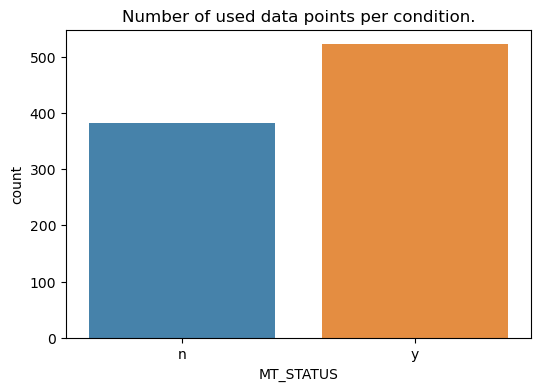

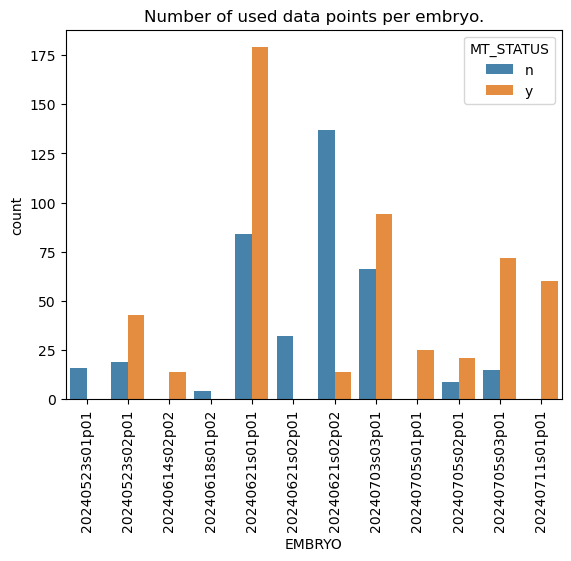

In [109]:
fig = plt.figure(figsize=(6, 4))
# Second subplot: Summary statistics

sns.countplot(data=df_results_filtered, x='MT_STATUS', hue='MT_STATUS', alpha=0.9)
plt.title(f'Number of used data points per condition.')
plt.show()

df_results_filtered = df_results_filtered.sort_values(by='EMBRYO', ascending=True)
sns.countplot(data=df_results_filtered, x='EMBRYO', hue='MT_STATUS', alpha=0.9)
plt.title(f'Number of used data points per embryo.')
plt.xticks(rotation=90)
plt.show()

# All data groupped together

In [110]:
# All the parameters that we are interested in with their labels for plots:

params = ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'rising_dif', 'rising_dif_norm', 'relative_dif', 'a', 'tau_r']

labels = ['$\\kappa$ (pN/$\\mathrm{\\mu m}$)', '$\\gamma_1$ (pN s/$\\mathrm{\\mu m}$)', '$\\gamma_2$ (pN s/$\\mathrm{\\mu m}$)', 'Ratio between elastic and viscous deformation', 'Displacement ($\\mathrm{\\mu m}$)', 'Displacement / Force ($\\mathrm{\\mu m}$/ pN)', 'a = Relaxation / Displacement ', 'a', '$\\tau_R$']

mapping = {'y': 'Interphase', 'n': 'M-phase'}

# Clustered data

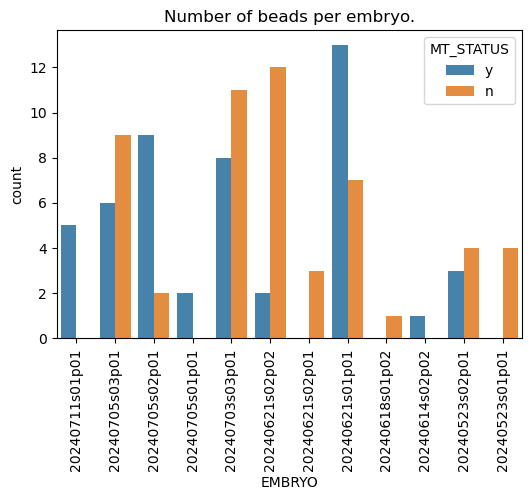

In [111]:
df_beads = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS', 'TRACK_ID']).count().reset_index()
df_beads = df_beads.sort_values(by=['EMBRYO', 'MT_STATUS'], ascending=False)

fig = plt.figure(figsize=(6, 4))

sns.countplot(data=df_beads, x='EMBRYO', hue='MT_STATUS', alpha=0.9)
plt.xticks(rotation=90)
plt.title(f'Number of beads per embryo.')
plt.show()

# Binned by force

## Data together with rolling average

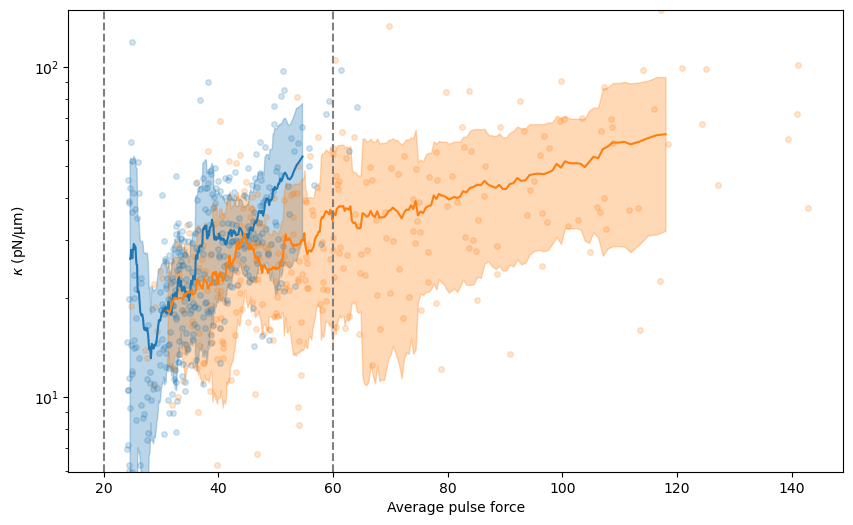

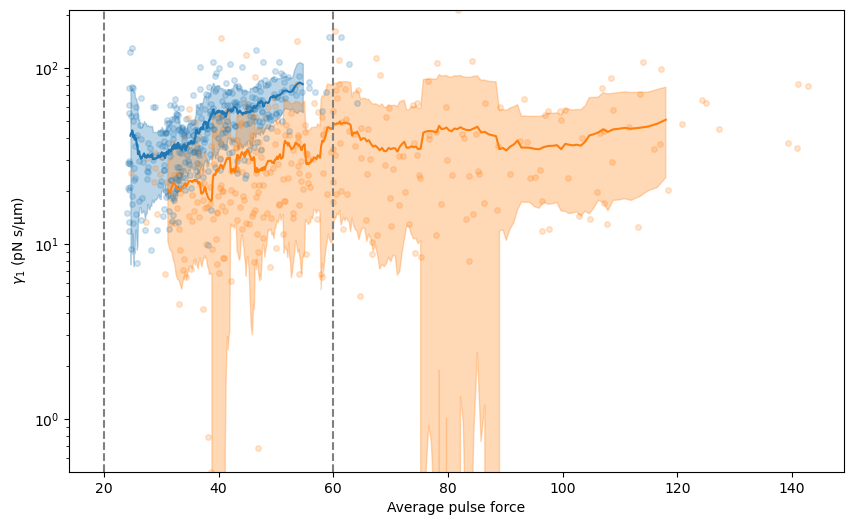

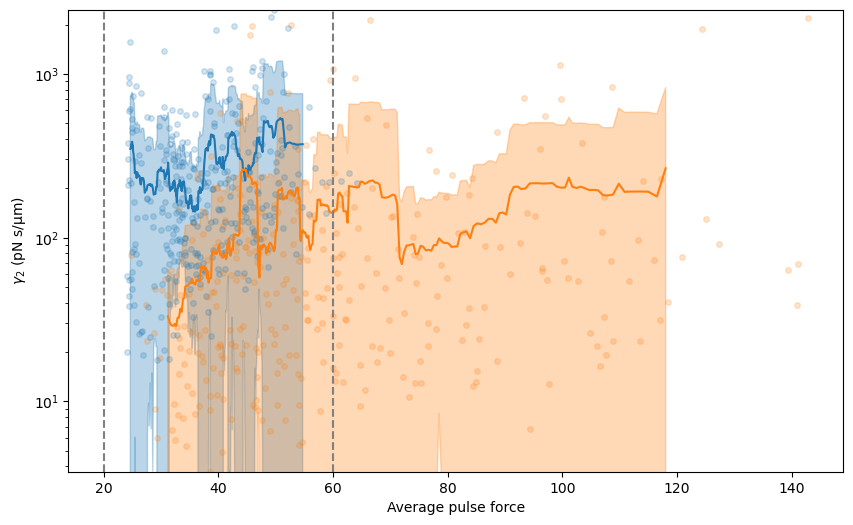

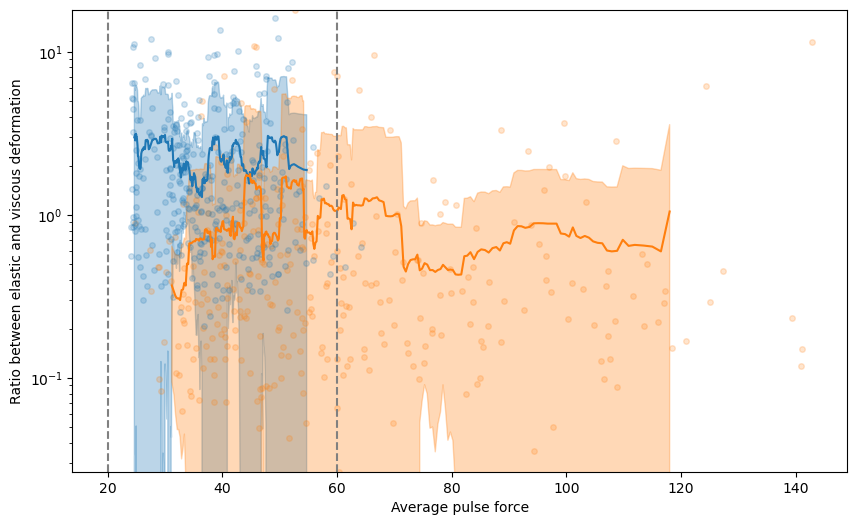

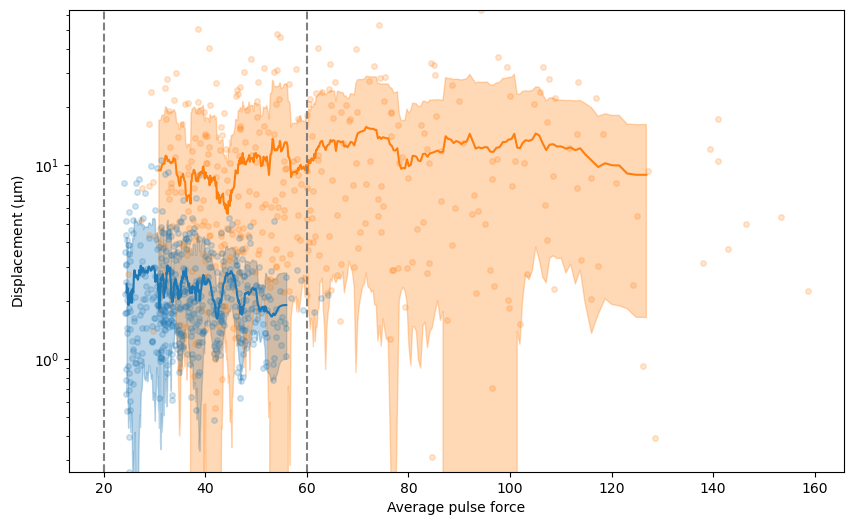

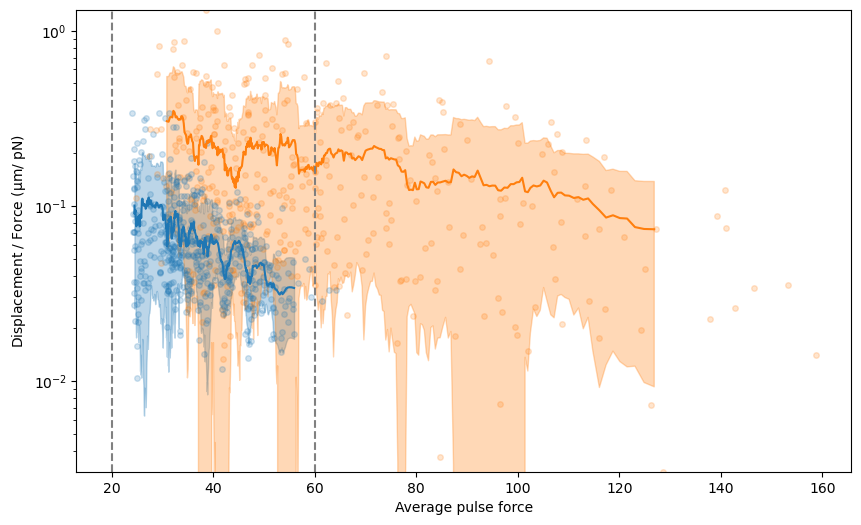

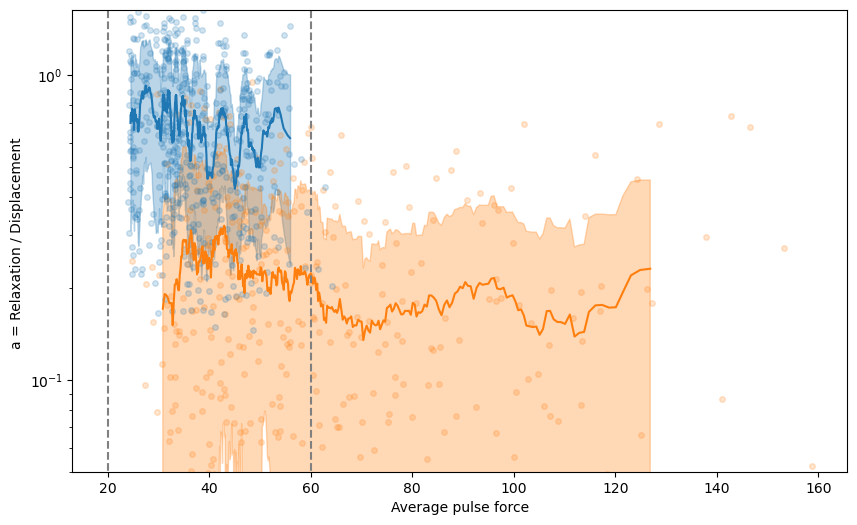

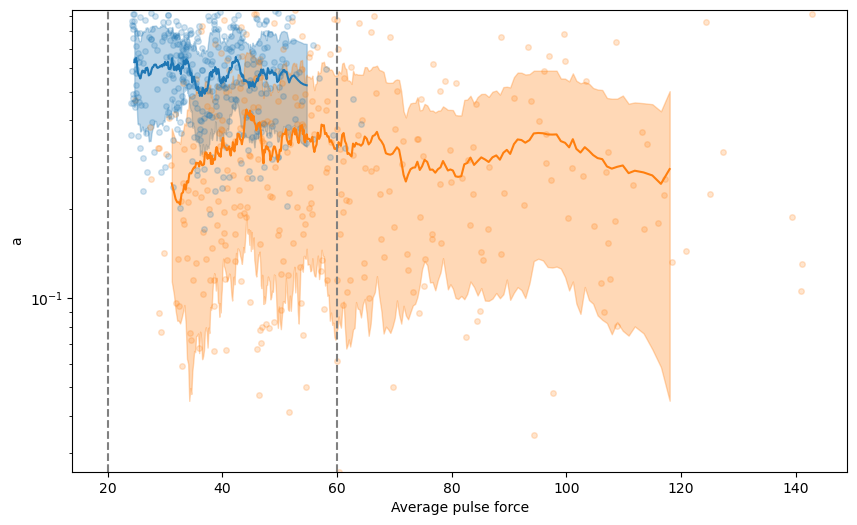

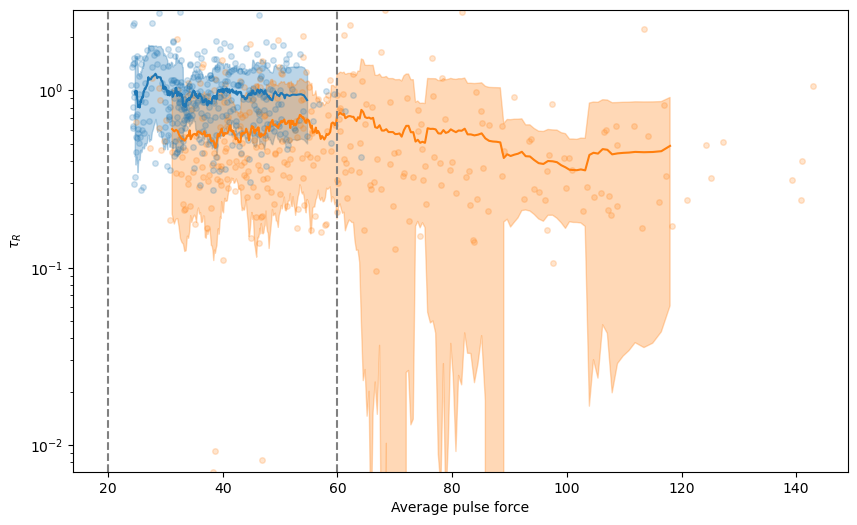

In [112]:
df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)

    fig = plt.figure(figsize=(10, 6))
    # plot all data
    plt.plot(df.loc[df['MT_STATUS']=='n', 'AVG_FORCE'], df.loc[df['MT_STATUS']=='n', param], 'o', color=sns.color_palette()[1], alpha=0.2, markersize = 4)
    plt.plot(df.loc[df['MT_STATUS']=='y', 'AVG_FORCE'], df.loc[df['MT_STATUS']=='y', param], 'o', color=sns.color_palette()[0], alpha=0.2, markersize = 4)
    
    window = 25
    # plot the roling average
    plt.plot(df.loc[df['MT_STATUS']=='y', 'AVG_FORCE'].rolling(window=window, center=True).mean(), df.loc[df['MT_STATUS']=='y', param].rolling(window=window, center=True).mean(), '-', color=sns.color_palette()[0], alpha=1)

    plt.plot(df.loc[df['MT_STATUS']=='n', 'AVG_FORCE'].rolling(window=window, center=True).mean(), df.loc[df['MT_STATUS']=='n', param].rolling(window=window , center=True).mean(), '-', color=sns.color_palette()[1], alpha=1)

    # plot the standard deviation
    plt.fill_between(df.loc[df['MT_STATUS']=='y', 'AVG_FORCE'].rolling(window=window, center=True).mean(), 
    df.loc[df['MT_STATUS']==mt_codes[0], param].rolling(window=window, center=True).mean()- df.loc[df['MT_STATUS']==mt_codes[0], param].rolling(window=window, center=True).std(), 
    df.loc[df['MT_STATUS']==mt_codes[0], param].rolling(window=window, center=True).mean()+ df.loc[df['MT_STATUS']==mt_codes[0], param].rolling(window=window, center=True).std(),
    color=sns.color_palette()[0], alpha=0.3)

    plt.fill_between(df.loc[df['MT_STATUS']=='n', 'AVG_FORCE'].rolling(window=window, center=True).mean(), 
    df.loc[df['MT_STATUS']==mt_codes[1], param].rolling(window=window, center=True).mean()- df.loc[df['MT_STATUS']==mt_codes[1], param].rolling(window=window, center=True).std(), 
    df.loc[df['MT_STATUS']==mt_codes[1], param].rolling(window=window, center=True).mean()+ df.loc[df['MT_STATUS']==mt_codes[1], param].rolling(window=window, center=True).std(),
    color=sns.color_palette()[1], alpha=0.3)

    plt.vlines(x=force_ranges, ymin=df[param].min(), ymax=df[param].max(), color='gray', linestyle='--', label='Force range')


    plt.xlabel('Average pulse force')
    plt.ylabel(label)
    plt.ylim(df[param].min(), df[param].max())
    if param == 'relative_dif':
        plt.ylim(bottom=0.05)
    plt.yscale('log')
    plt.show()

# Histograms of binned force data

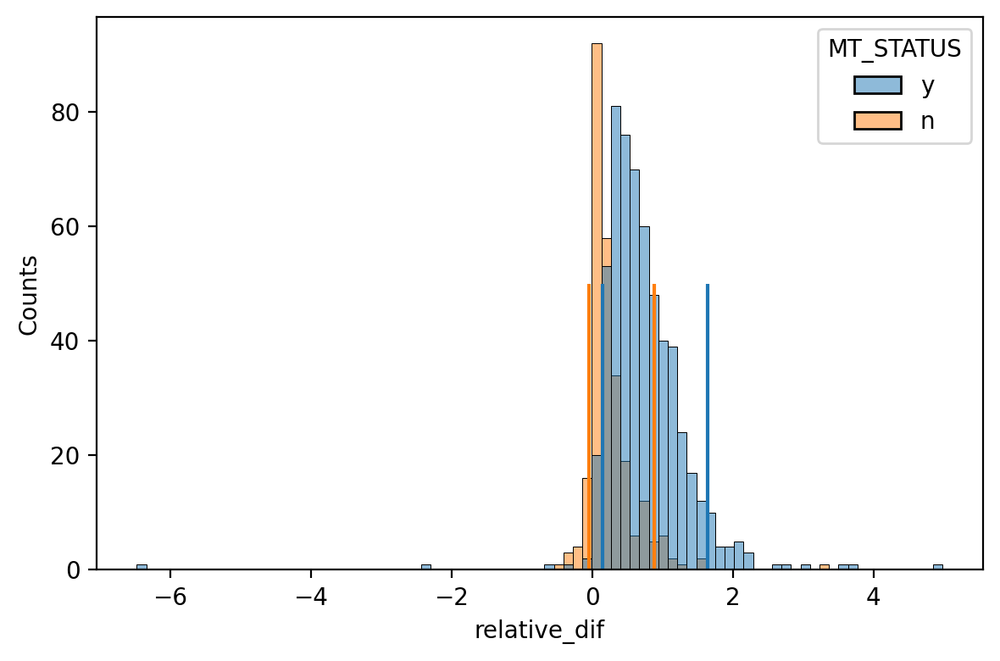

In [113]:

# for (param, label) in zip(params, labels):

param = 'relative_dif'
fig = plt.figure(figsize=(6, 4), dpi=200)
df_binned_force = df_results_all[(df_results_all['AVG_FORCE']>force_ranges[0][0])&(df_results_all['AVG_FORCE']<force_ranges[0][1])]
# Compute mean and standard deviation
for (mt_status, color) in zip(['y', 'n'], [sns.color_palette()[0], sns.color_palette()[1]]):
    values = df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, param]
    ci = np.percentile(values, [5, 95])
    plt.vlines(ci[0], 0, 50, color=color)
    plt.vlines(ci[1], 0, 50, color=color)

sns.histplot(df_binned_force, x=param, hue='MT_STATUS')
plt.xlabel(param)
plt.ylabel('Counts')
plt.tight_layout()
plt.savefig(f'{dir_plots}/results/auxiliary_plots_statistics/result_histogram_{param}.svg', format='svg')
plt.show()

# Confidence intervals and p values of parameters

In [114]:
df_data_stats = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS']).median(numeric_only=True).reset_index()
df_data_stats['group_size'] = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS']).size().values

rng = np.random.default_rng()
df_params_stats = pd.DataFrame()
p_values = dict()

for param in params:
    df_binned_force = df_data_stats
    for mt_status in ['y', 'n']:

        weights=df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, 'group_size'].values
        weighted_average, ci = weighted_bootstrap(df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)

        new_line = {'parameter': param, 
                    'weighted_average': weighted_average,
                    'conf_int_low': ci[0], 
                    'conf_int_high': ci[1],
                    'y_err_low': weighted_average - ci[0],
                    'y_err_high': ci[1] - weighted_average,
                    'MT_STATUS': mt_status
                    }
        df_params_stats = pd.concat([df_params_stats, pd.DataFrame(new_line, index=[0])])

    res = ttest_ind(df_binned_force.loc[df_binned_force['MT_STATUS']=='n', param].values, 
                    df_binned_force.loc[df_binned_force['MT_STATUS']=='y', param].values, alternative='two-sided', usevar='unequal')
    pval = res[1]
    
    p_values[param] = pval


df_params_stats.head(20)
df_params_stats.to_csv(f'{dir_plots}/results/results_material_properies_stats_{subtr_bck_label}.csv', index=False)

In [ ]:
df_results_from_average_curves = pd.read_csv(f'{dir_plots}/results/results_parameters_curve_averaged_force_range{force_ranges[0][0]}-{force_ranges[0][1]}pN_{subtr_bck_label}{creep_only_label}.csv')
df_results_from_average_curves['group_size'] = df_results_from_average_curves .groupby(['EMBRYO', 'MT_STATUS']).size().values

df_params_avg_curves_stats = pd.DataFrame()

p_values_avg_curves = dict()

for param in params:
    if param in df_results_from_average_curves.columns:
        weights_ = set()
        for mt_status in ['y', 'n']:

            weights=df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']==mt_status, 'group_size'].values
            weighted_average, ci = weighted_bootstrap(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)

            new_line = {'parameter': param, 
                        'weighted_average': weighted_average,
                        'conf_int_low': ci[0], 
                        'conf_int_high': ci[1],
                        'y_err_low': weighted_average - ci[0],
                        'y_err_high': ci[1] - weighted_average,
                        'MT_STATUS': mt_status
                        }
            df_params_avg_curves_stats = pd.concat([df_params_avg_curves_stats, pd.DataFrame(new_line, index=[0])])


        weights = (df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='y', 'COUNT'].values*len(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='y', 'COUNT'].values)/np.sum(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='y', 'COUNT'].values), 
        df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='n', 'COUNT'].values*len(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='n', 'COUNT'].values)/np.sum(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='n', 'COUNT'].values))

        res  = ttest_ind(
            df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='y', param].values, df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='n', param].values,  weights=weights, alternative='two-sided', usevar='unequal')
    
        pval = res[1]
    
        p_values_avg_curves[param] = pval

df_params_avg_curves_stats.to_csv(f'{dir_plots}/results/results_material_properies_avg_curves_stats_{subtr_bck_label}.csv', index=False)
# print('P-values for the parameters from the averaged curves:', p_values_avg_curves)

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_71368/1690189378.py:13: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('tab10'), zorder=1)


Fold change for k: [1.15588114]


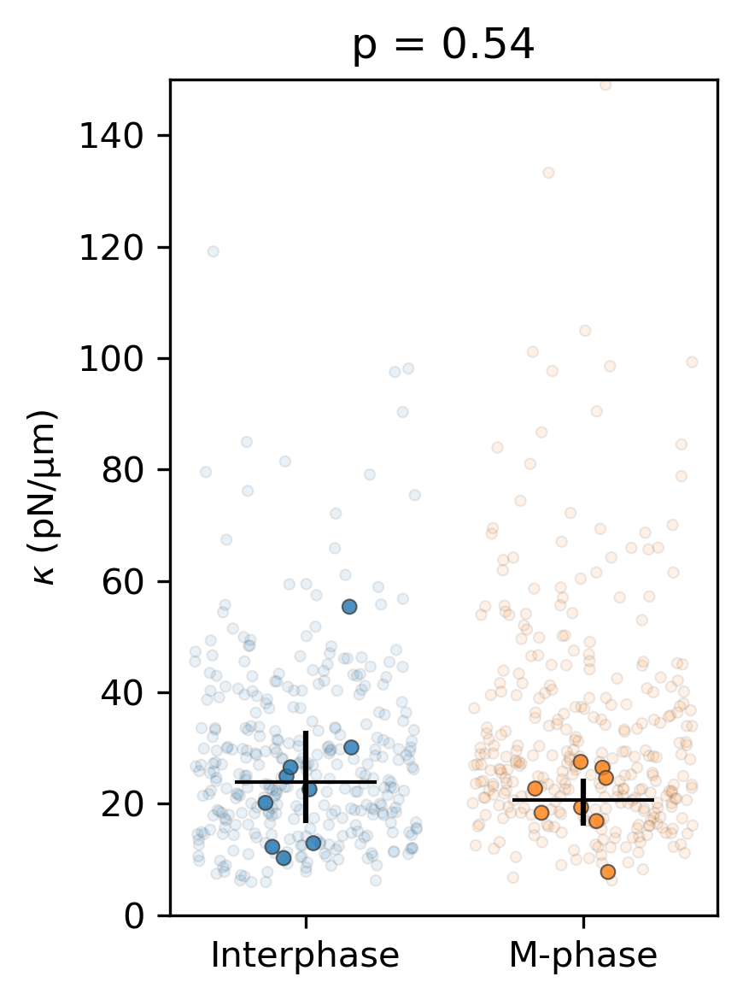

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_71368/1690189378.py:13: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('tab10'), zorder=1)


Fold change for eta_1: [1.6464237]


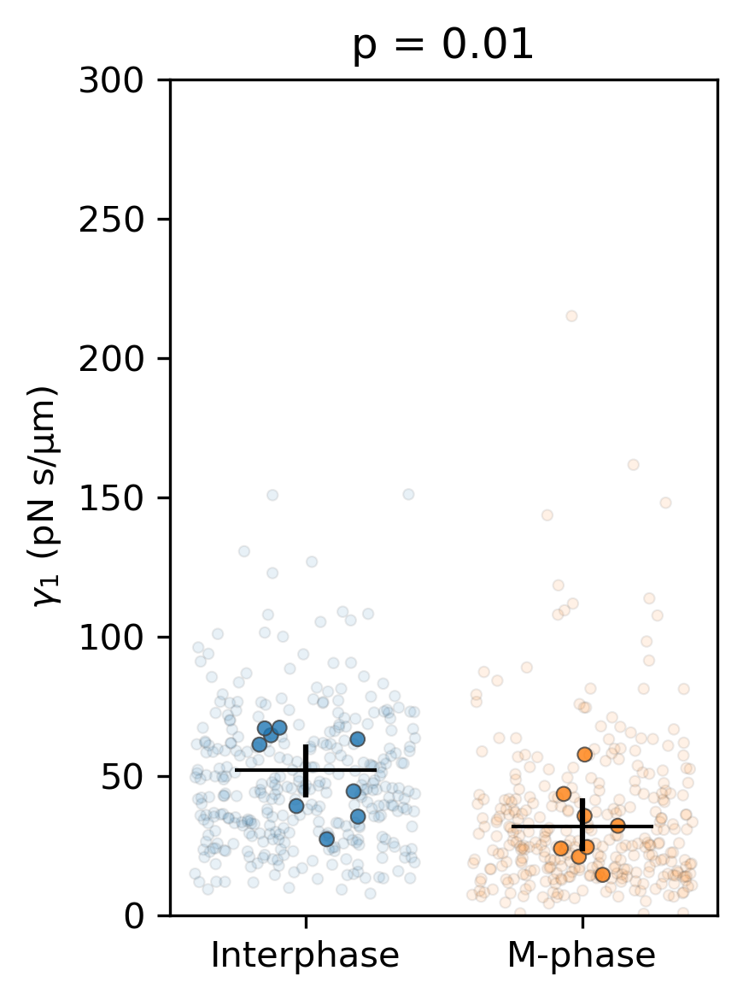

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_71368/1690189378.py:13: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('tab10'), zorder=1)


Fold change for eta_2: [8.50803628]


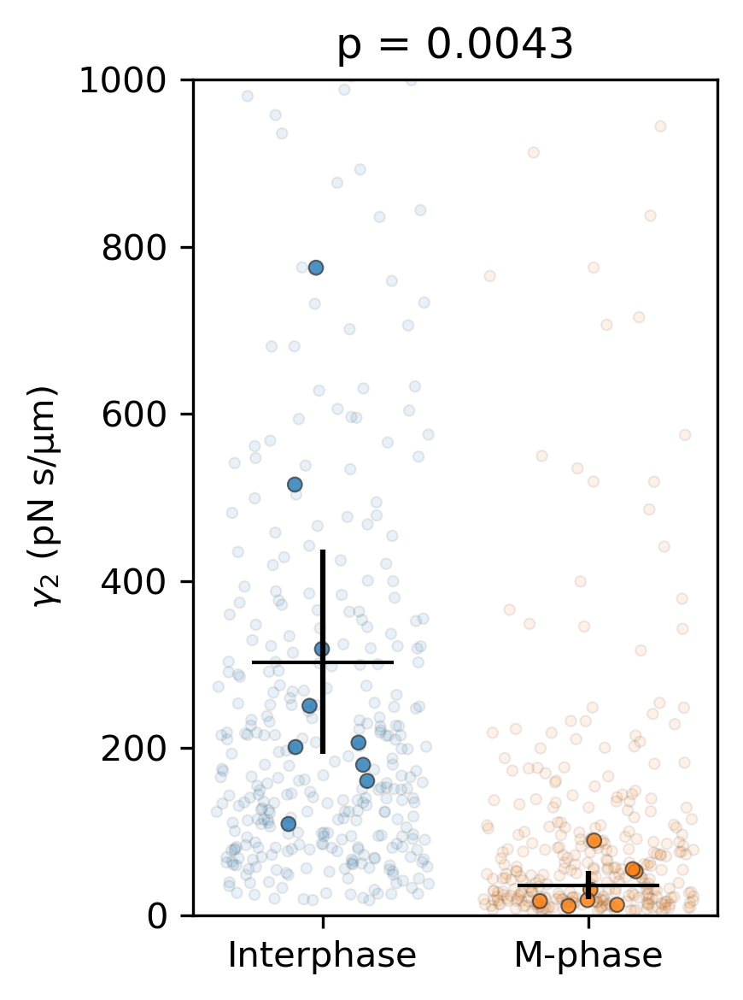

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_71368/1690189378.py:13: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('tab10'), zorder=1)


Fold change for elastic_viscous_ratio: [7.14614094]


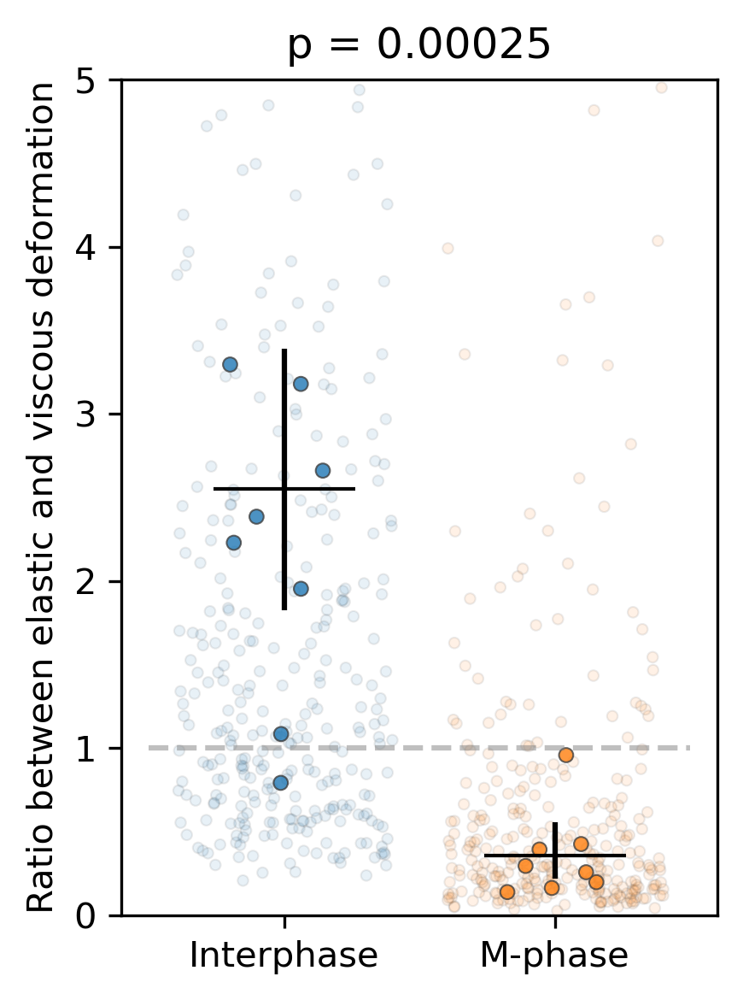

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_71368/1690189378.py:13: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('tab10'), zorder=1)


Fold change for rising_dif: [0.18614152]


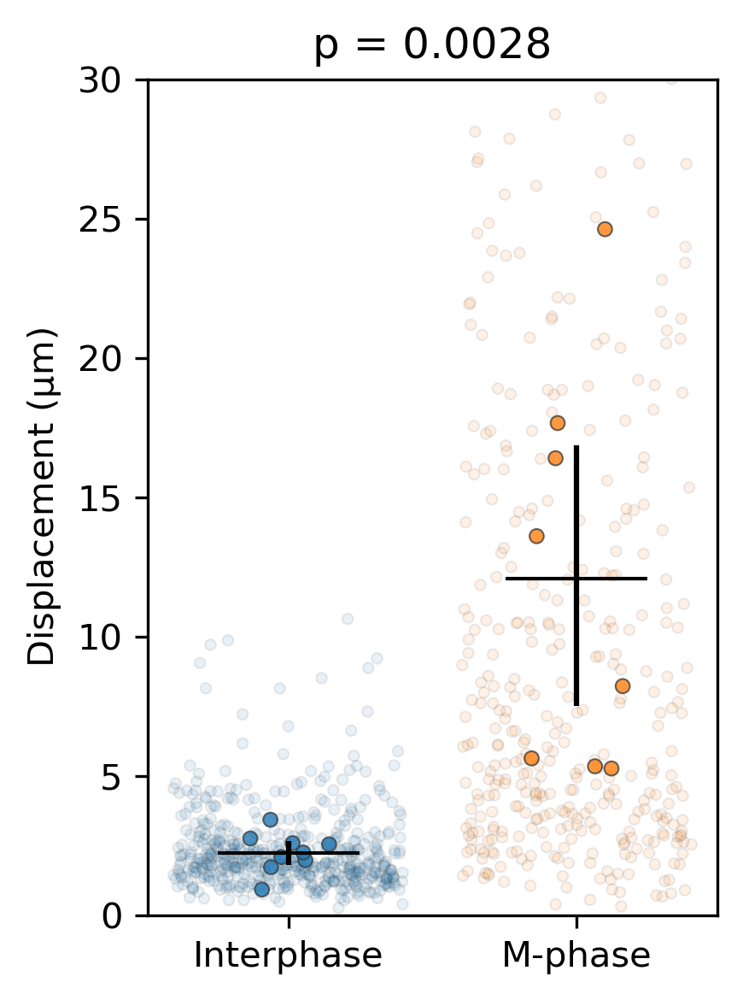

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_71368/1690189378.py:13: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('tab10'), zorder=1)


Fold change for rising_dif_norm: [0.24609153]


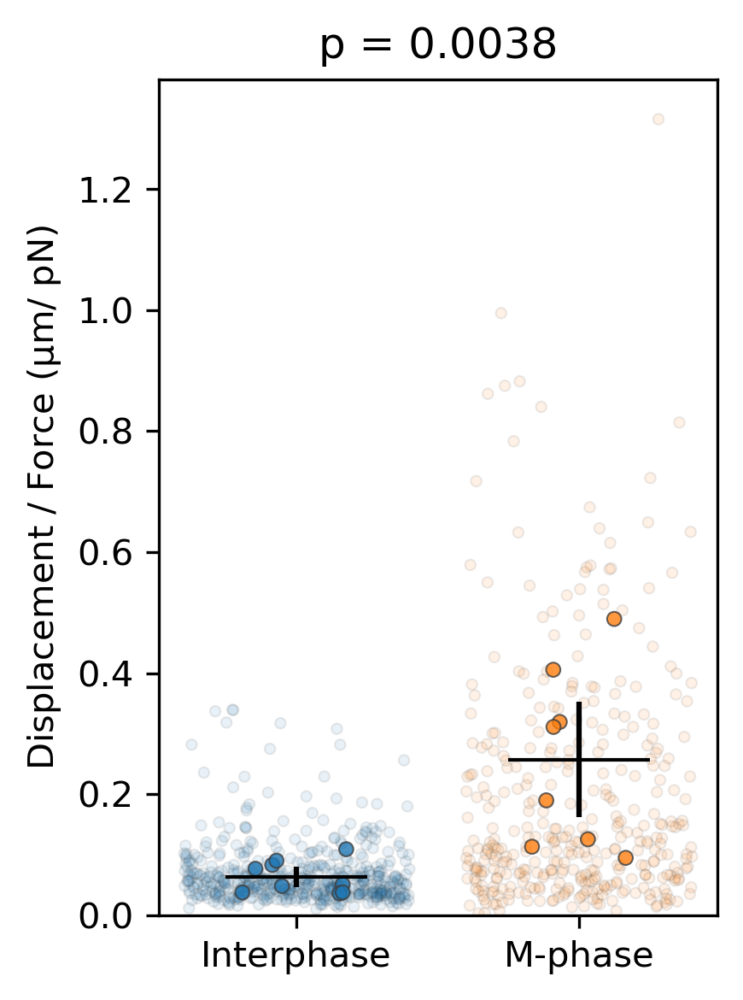

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_71368/1690189378.py:13: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('tab10'), zorder=1)


Fold change for relative_dif: [2.93088822]


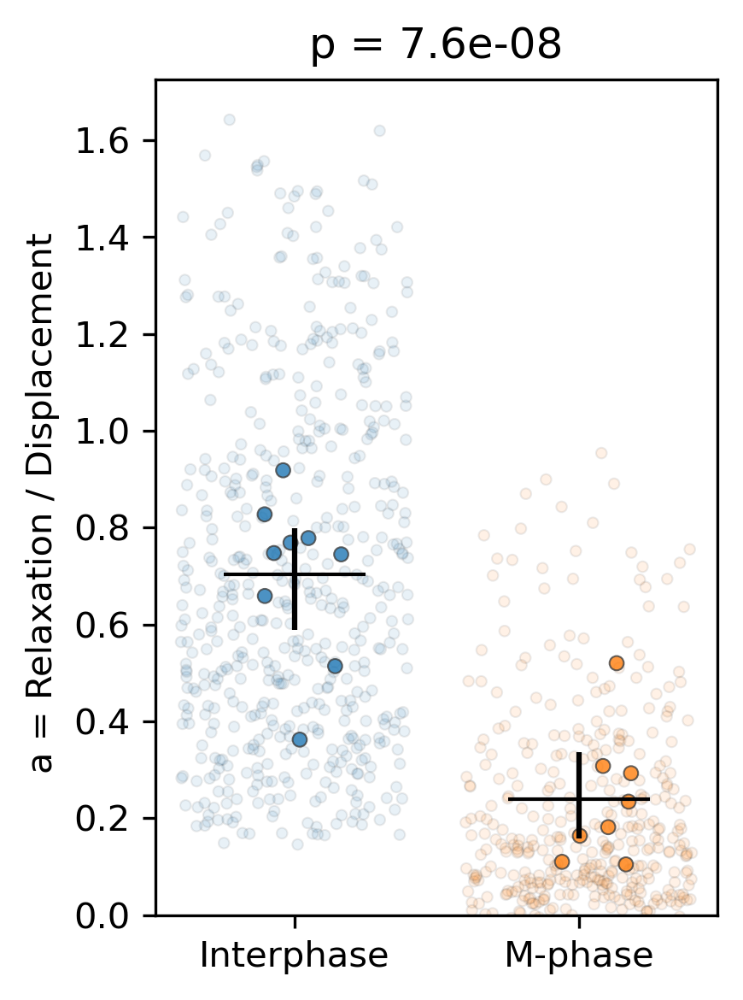

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_71368/1690189378.py:13: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('tab10'), zorder=1)


Fold change for a: [2.81593053]


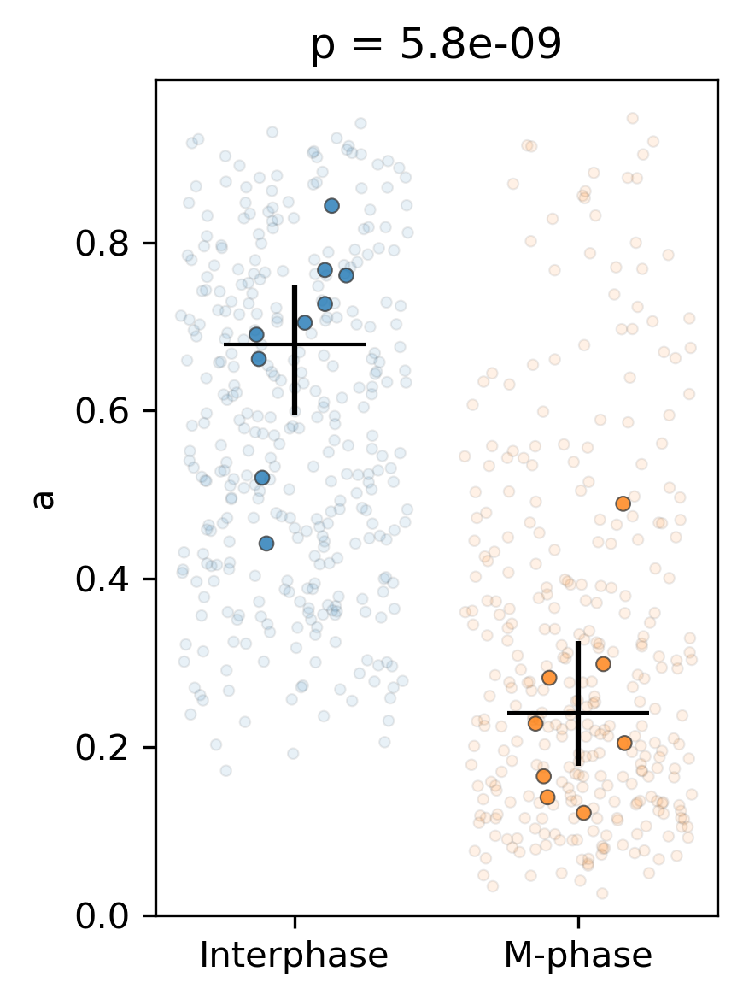

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_71368/1690189378.py:13: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('tab10'), zorder=1)


Fold change for tau_r: [1.54693947]


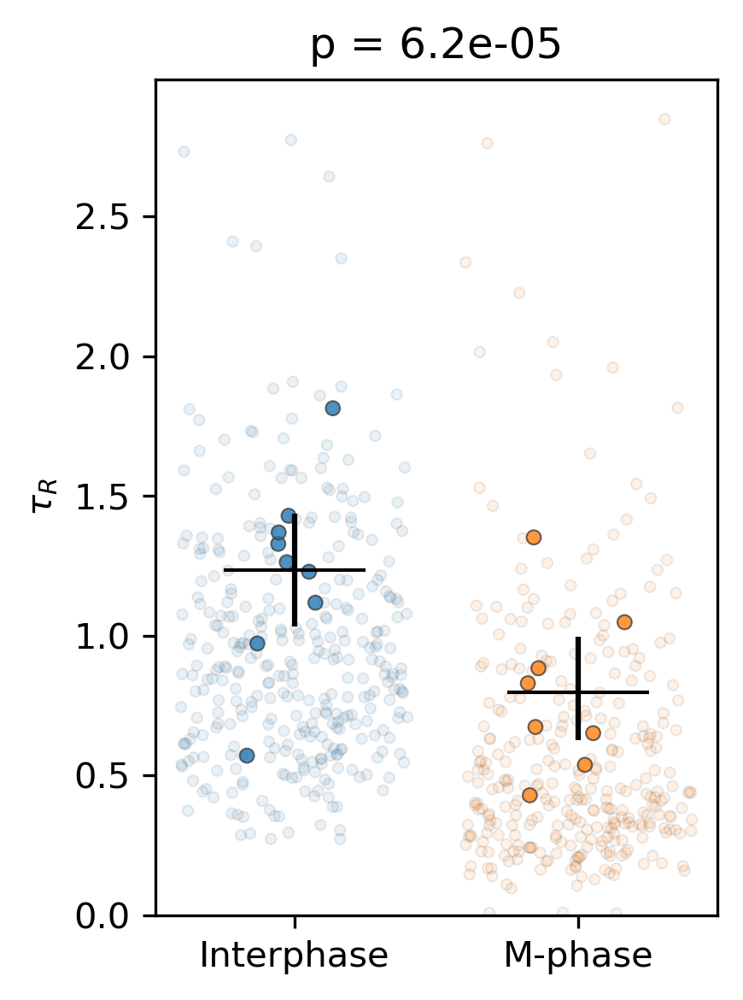

In [116]:
df_data_stats = df_data_stats.sort_values(by='MT_STATUS', ascending=False)

for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)
    p_value = p_values[param]
    fig = plt.figure(figsize=(3, 4), dpi=300)
    sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df, jitter=0.4, alpha=0.1, linewidth=0.5, legend=False, size=3, zorder=0)

    if param in df_results_from_average_curves.columns:
        p_value_avg_curves = p_values_avg_curves[param]
        sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('tab10'), zorder=1)


    plt.errorbar(df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'MT_STATUS'], 
                df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'weighted_average'], 
                yerr=np.array([df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'y_err_low'].values, df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'y_err_high'].values]), 
                marker = '_', markersize=40,  color='black', linestyle='', zorder=2)
    print(f'Fold change for {param}:',  df_params_avg_curves_stats.loc[(df_params_avg_curves_stats['parameter']==param)&(df_params_avg_curves_stats['MT_STATUS']=='y'), 'weighted_average'].values/df_params_avg_curves_stats.loc[(df_params_avg_curves_stats['parameter']==param)&(df_params_avg_curves_stats['MT_STATUS']=='n'), 'weighted_average'].values)

    plt.title(f'p = {p_value_avg_curves:.2g}')
    plt.ylabel(label)
    plt.xlabel('')
    plt.ylim(bottom=0)
    plt.xticks(ticks = ['y', 'n'], labels=['Interphase', 'M-phase'])
    if param == 'k':
        plt.ylim(bottom=0, top=150)
    elif param == 'eta_1':
        plt.ylim(bottom=0, top=300)
    elif param == 'eta_2':
        plt.ylim(bottom=0, top=1000)
    elif param == 'elastic_viscous_ratio':
        plt.ylim(bottom=0, top=5)
        plt.hlines(1, -0.5, 1.5, color='gray', linestyle='--', alpha=0.5)
    elif param == 'rising_dif':
        plt.ylim(bottom=0, top=30)

    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/result_{param}.svg', format='svg')
    plt.show()

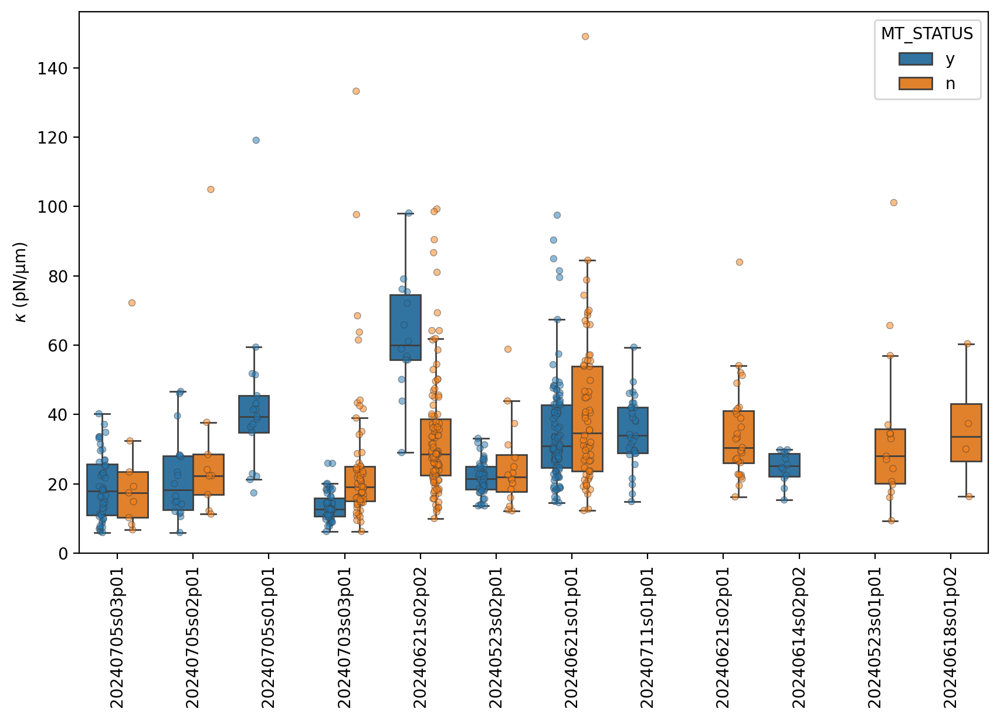

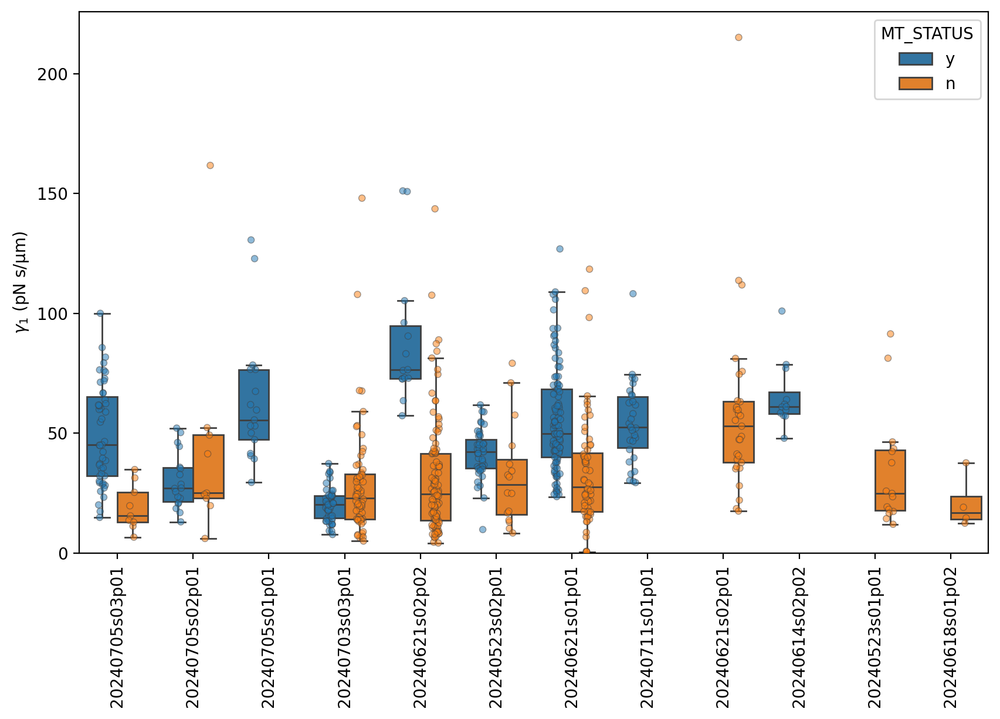

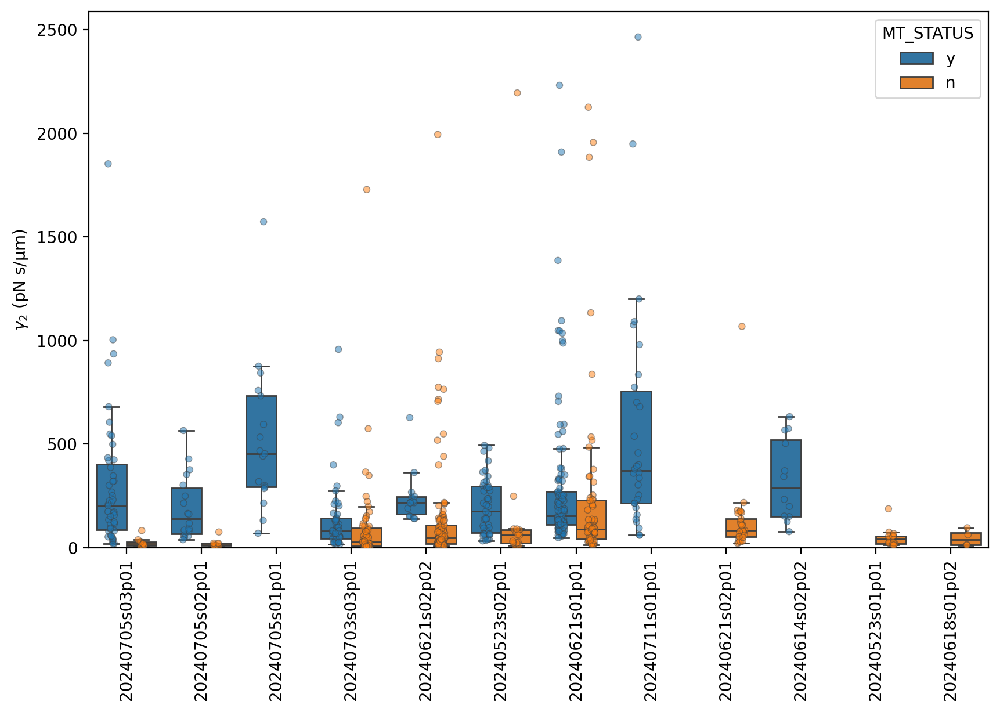

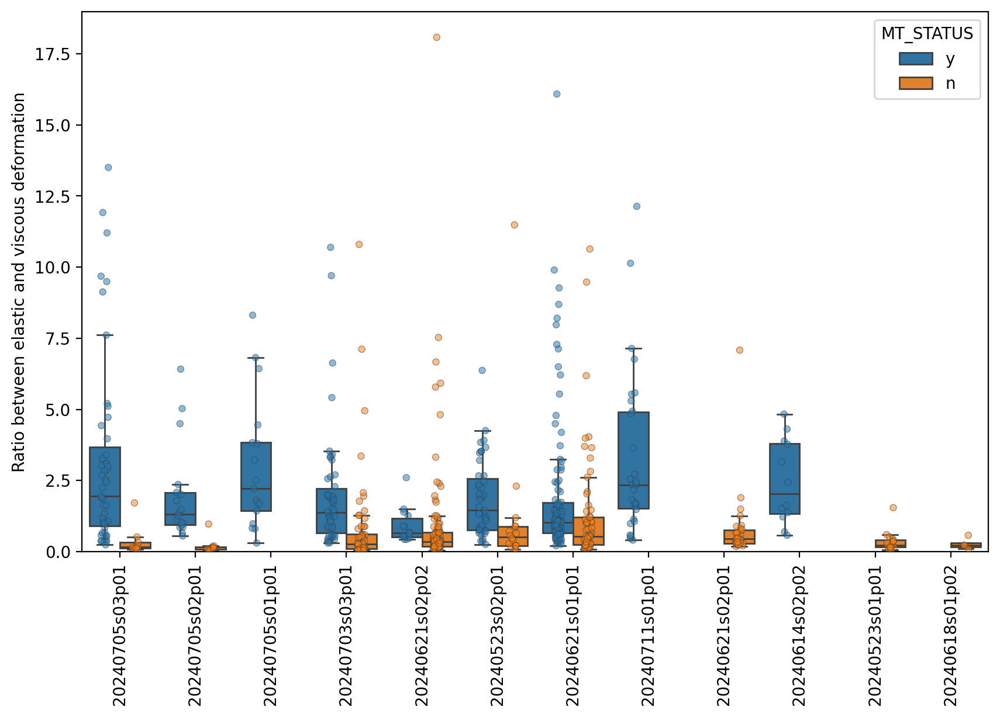

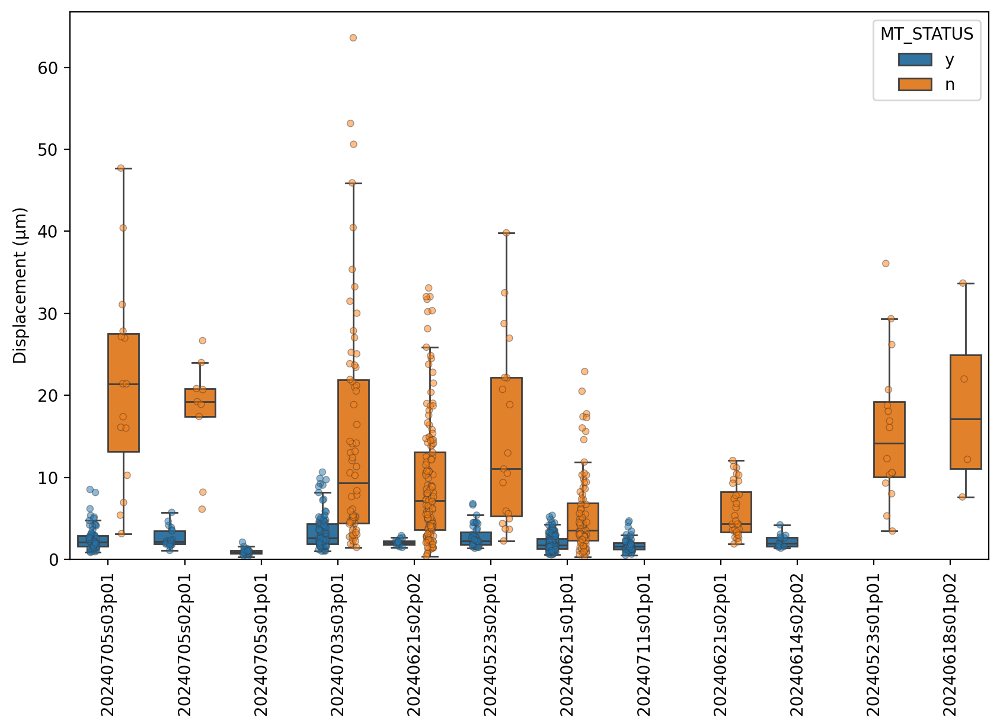

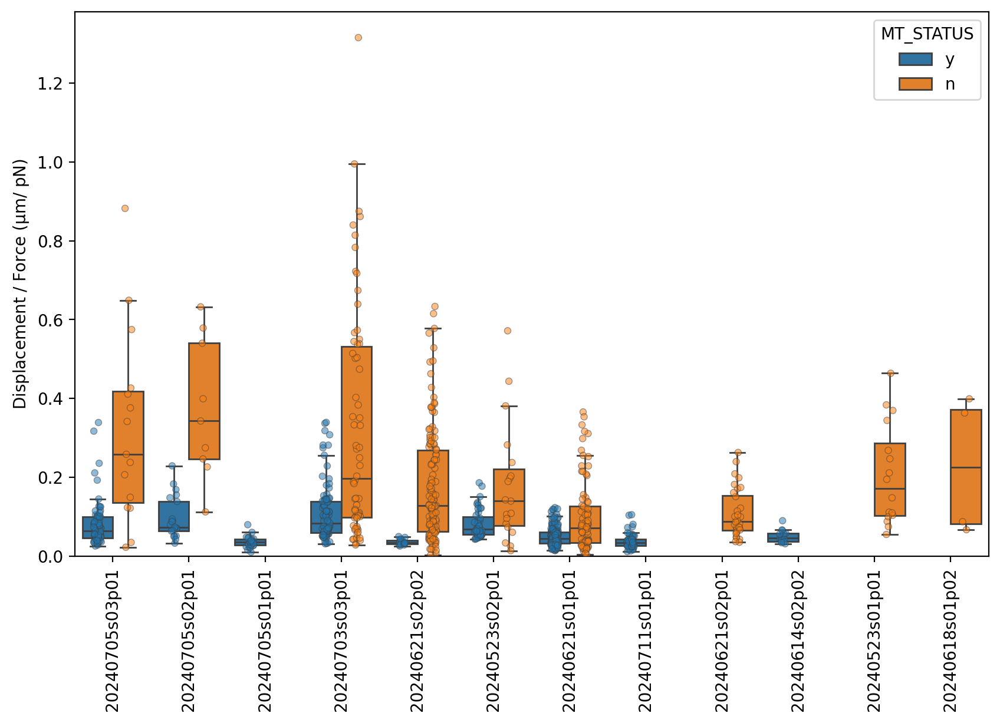

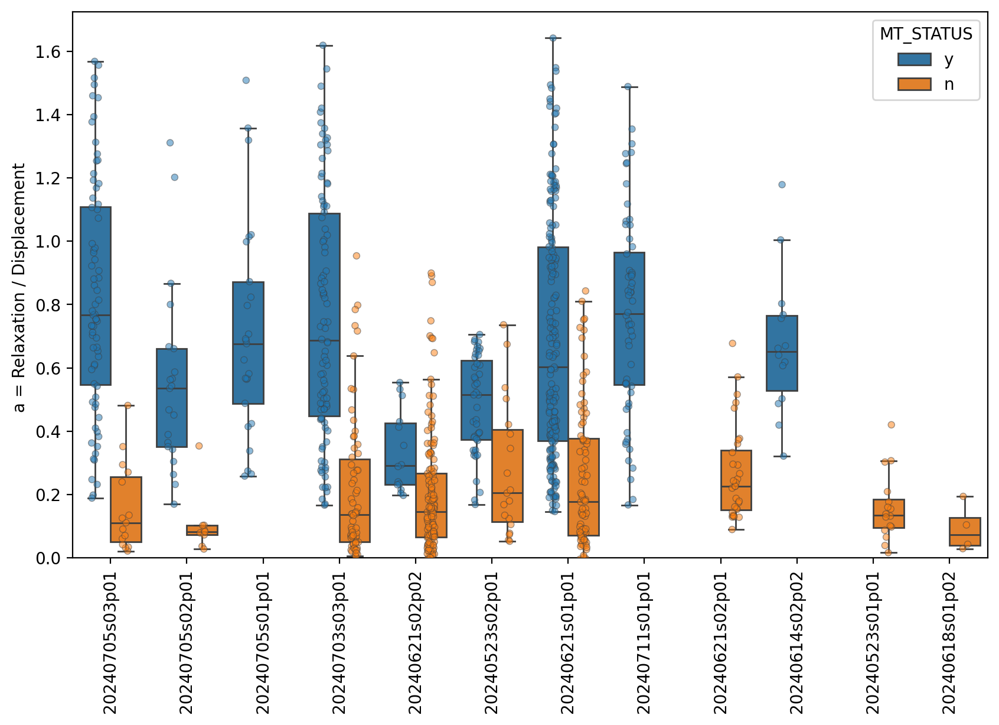

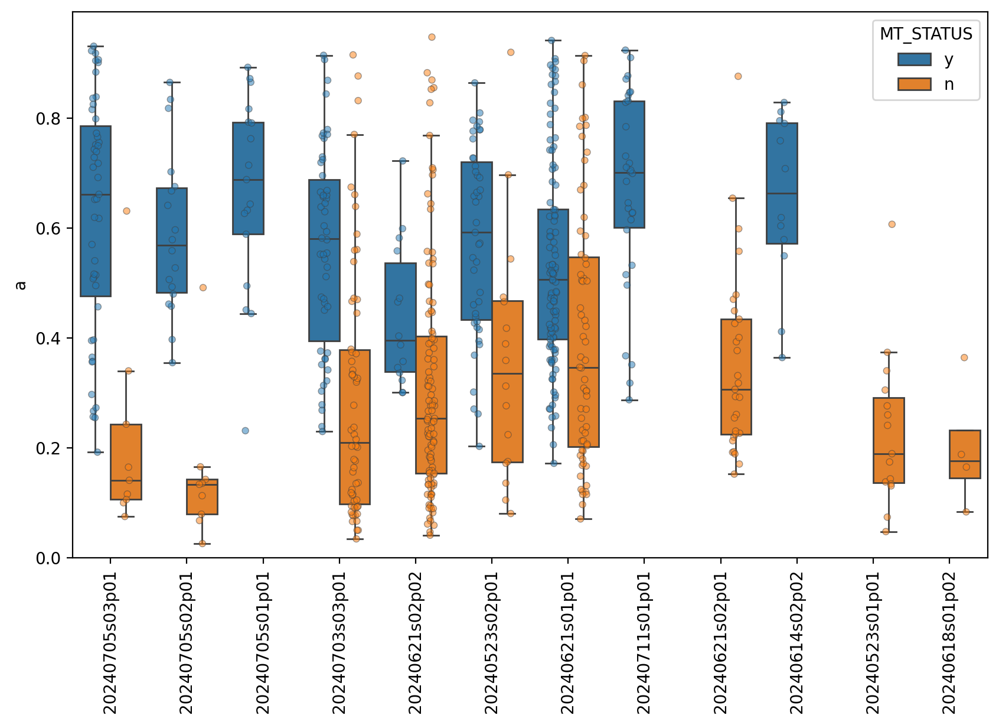

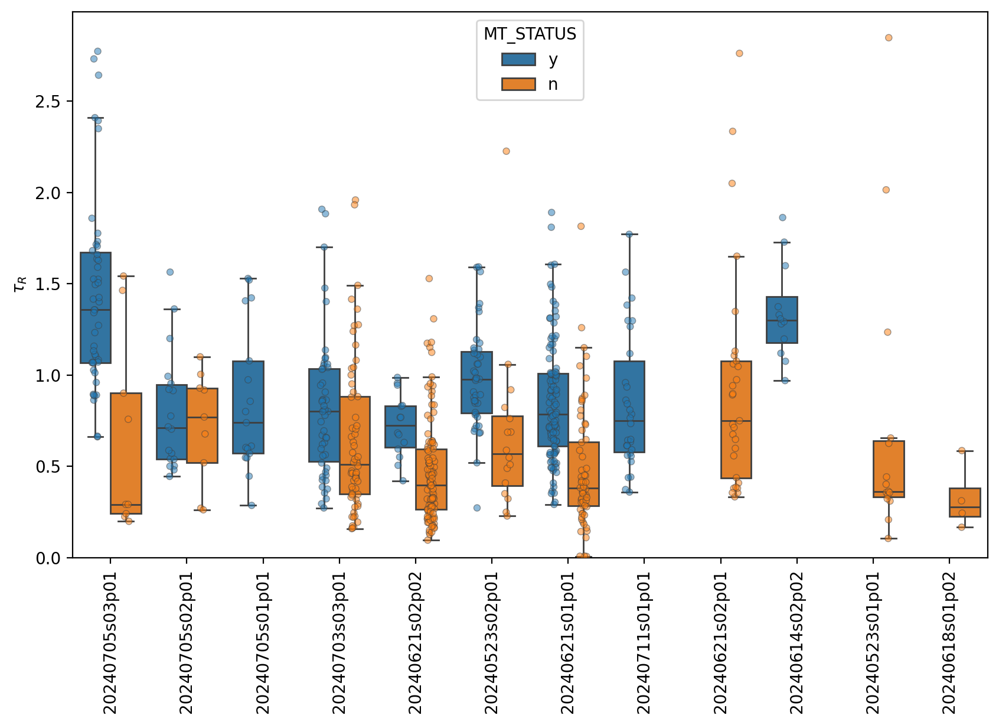

In [117]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)


for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)

    fig = plt.figure(figsize=(10, 6), dpi=200)
    sns.boxplot(x='EMBRYO', y=param, hue='MT_STATUS', data=df, fliersize=0)
    sns.stripplot(x='EMBRYO', y=param, hue='MT_STATUS', data=df, dodge=True, jitter=True, alpha=0.5, linewidth=0.5, legend=False, size=4)
    plt.xlabel('')
    plt.ylabel(label)
    plt.ylim(bottom=0)
    plt.xticks(rotation=90)
    plt.show()

## Bootstrapping the data

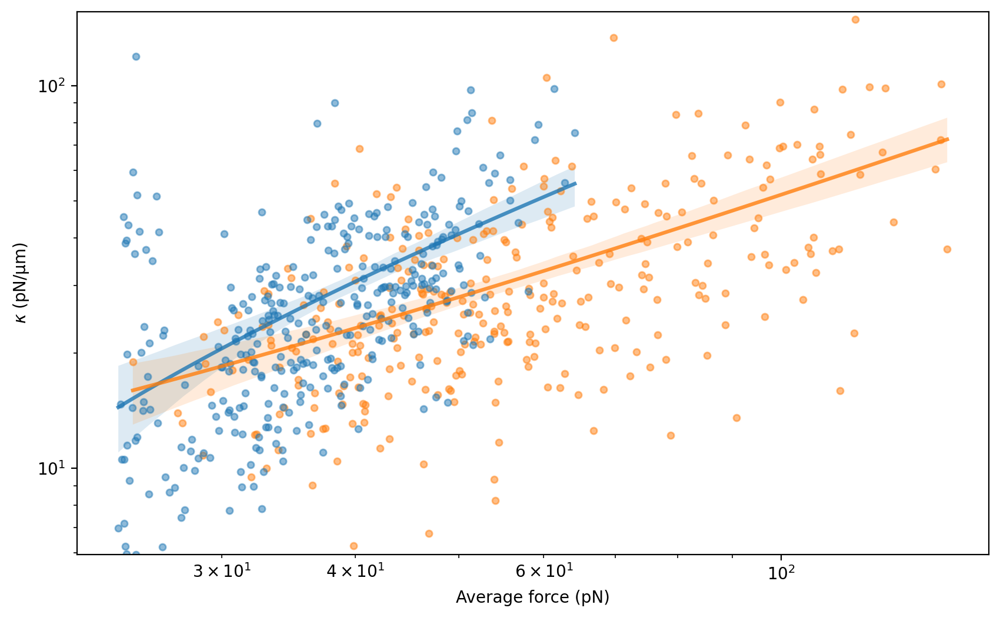

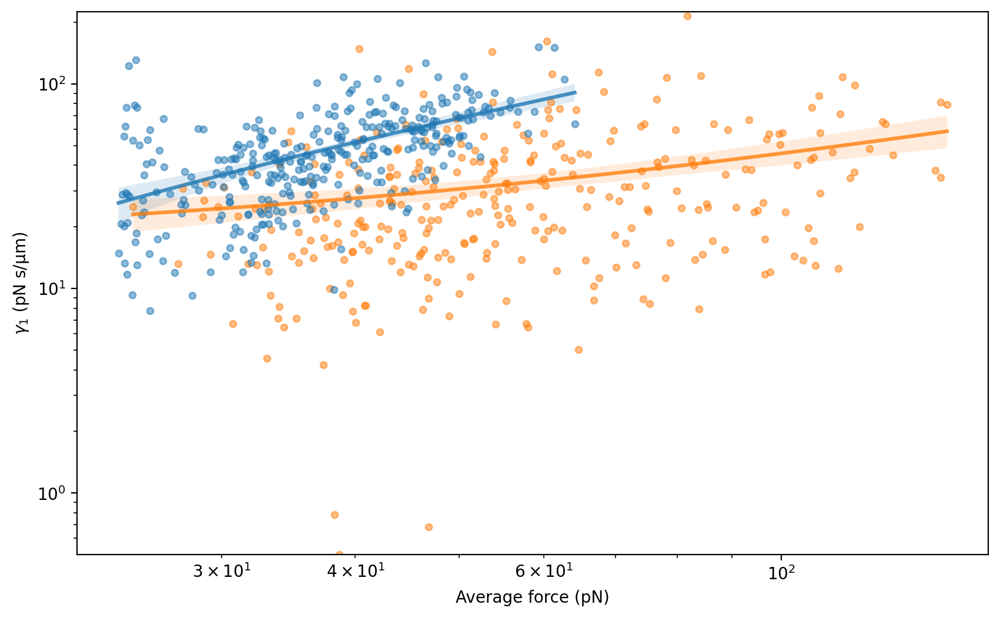

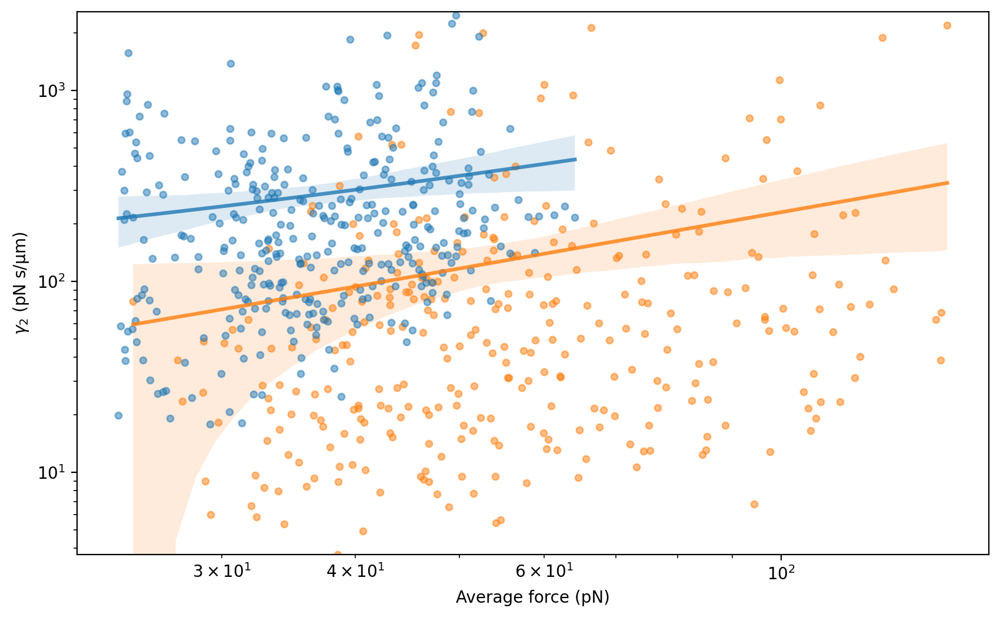

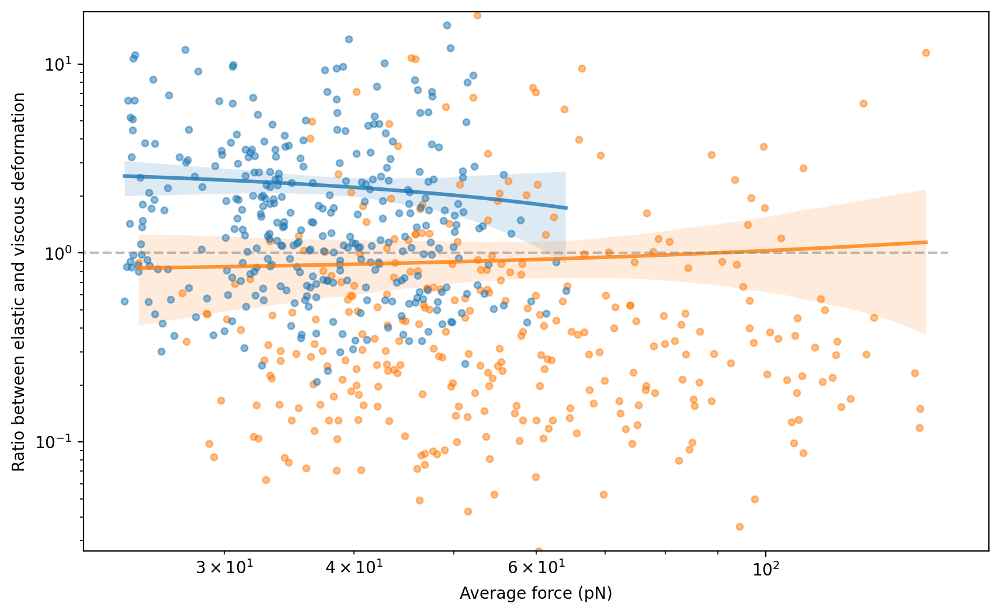

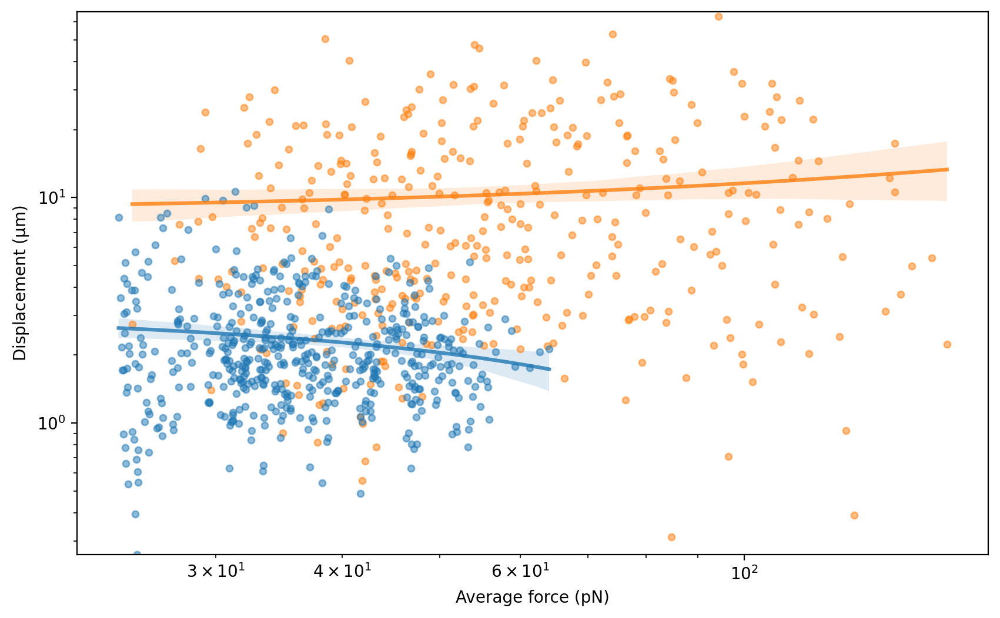

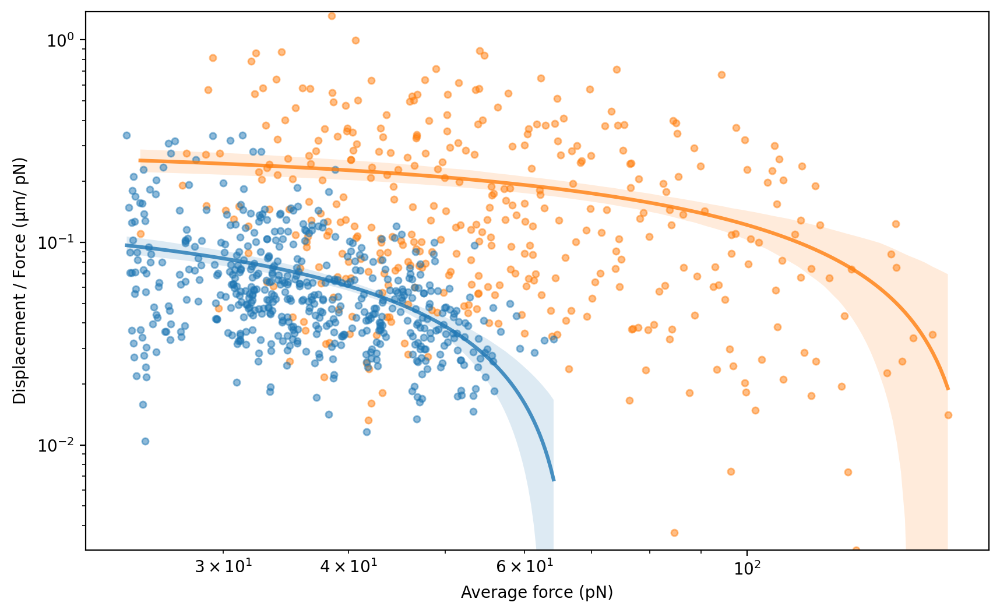

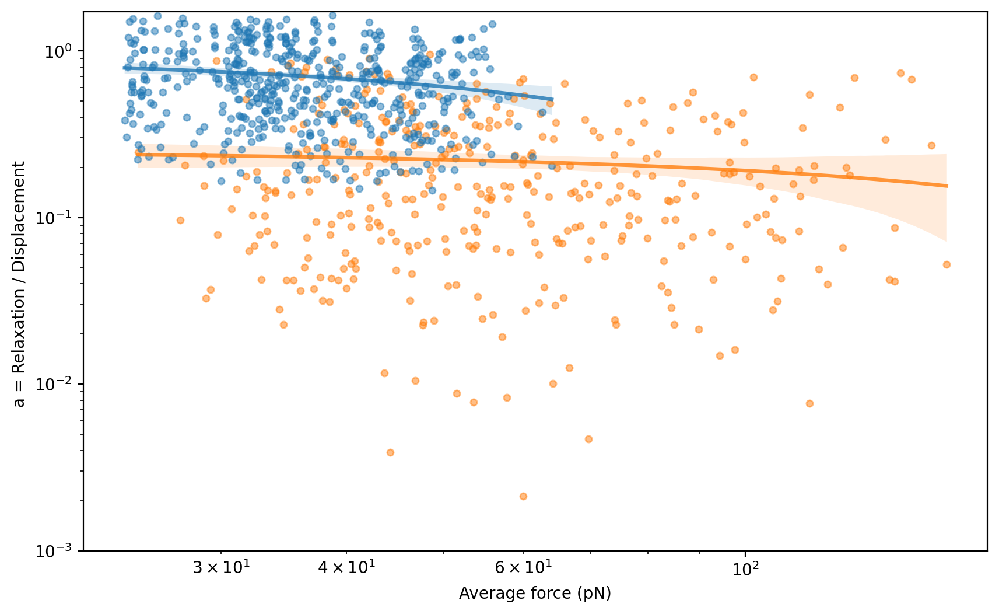

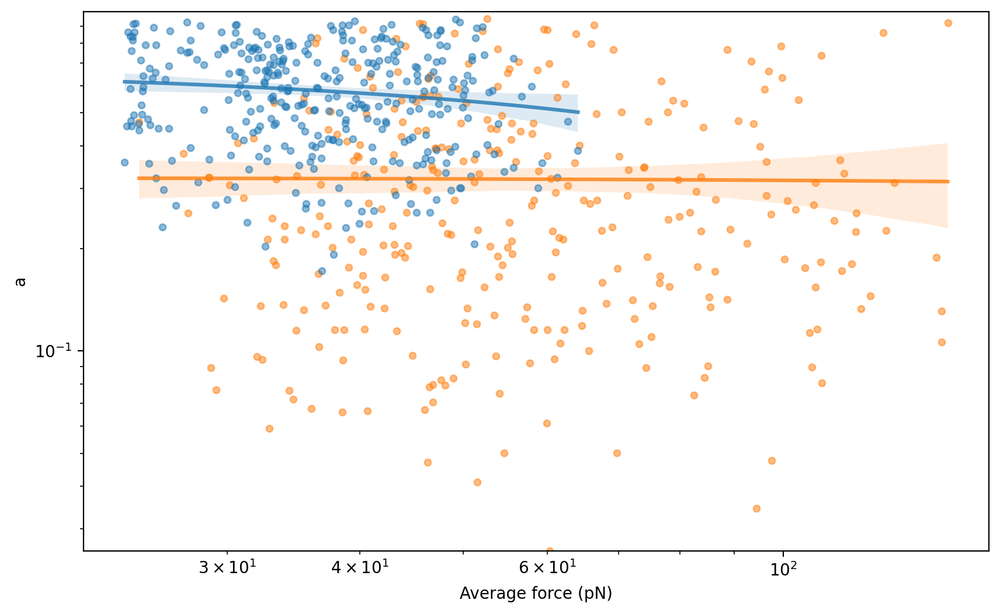

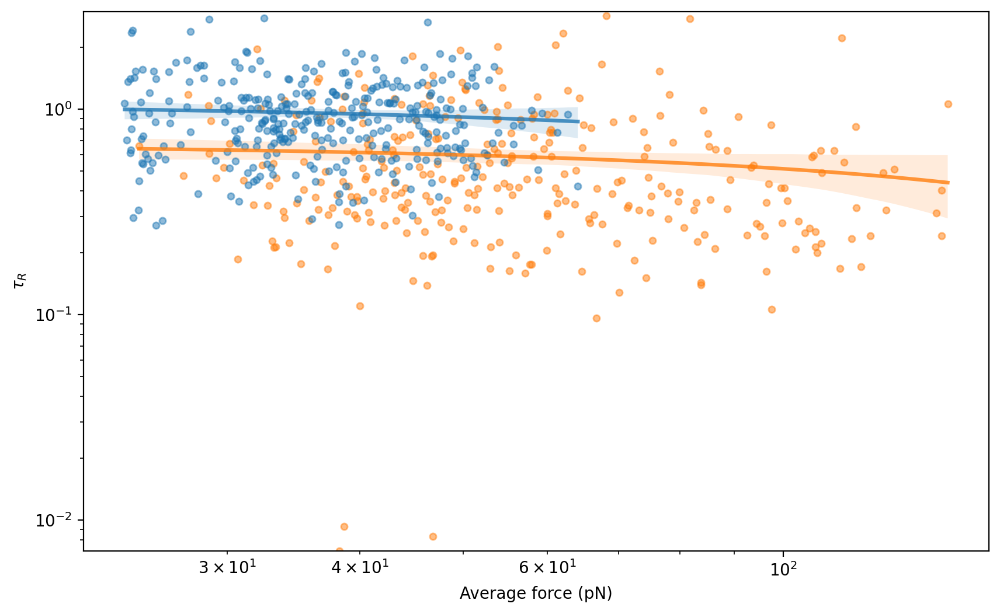

In [118]:
df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)
    fig = plt.figure(figsize=(10, 6), dpi=200)
    # plot all data
    plt.plot(df.loc[(df['MT_STATUS']=='n'), 'AVG_FORCE'], df.loc[(df['MT_STATUS']=='n'), param], 'o', color=sns.color_palette()[1], alpha=0.5, markersize = 4)
    plt.plot(df.loc[(df['MT_STATUS']=='y'), 'AVG_FORCE'], df.loc[(df['MT_STATUS']=='y'), param], 'o', color=sns.color_palette()[0], alpha=0.5, markersize = 4)
    
    sns.regplot(data=df[(df['MT_STATUS']=='y')], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[0], alpha=0.8))

    sns.regplot(data=df[(df['MT_STATUS']=='n')], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[1], alpha=0.8))

    if param =='elastic_viscous_ratio':
        plt.hlines(1, 0, 150, color='gray', linestyle='--', alpha=0.5)
    
    plt.xlabel('Average force (pN)')
    plt.ylabel(label)
    plt.ylim(bottom=max(df[param].min(), 0.001))
    # plt.xlim(left=0)
    # plt.ylim(bottom=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

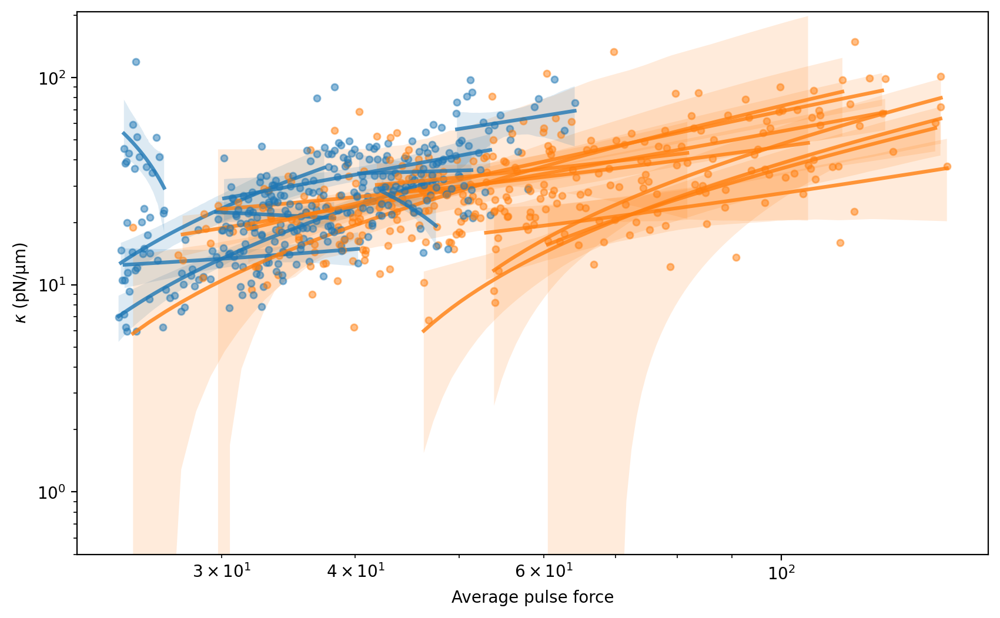

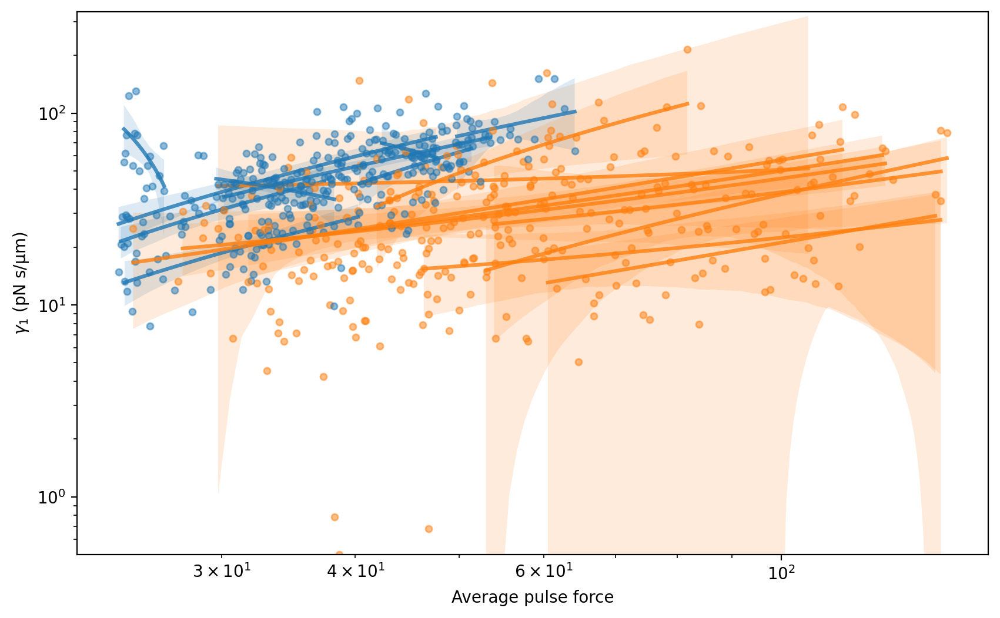

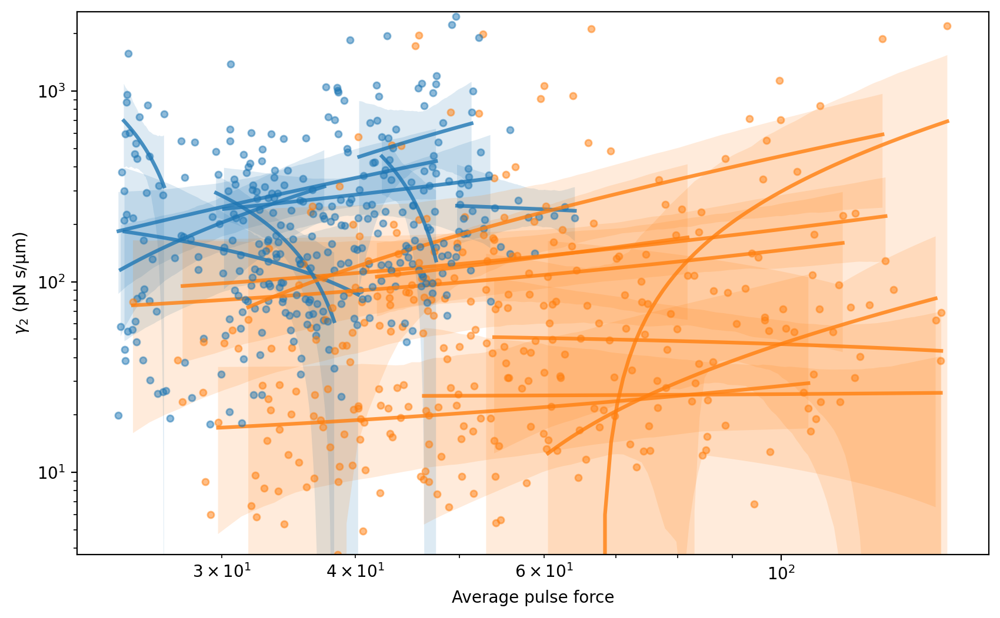

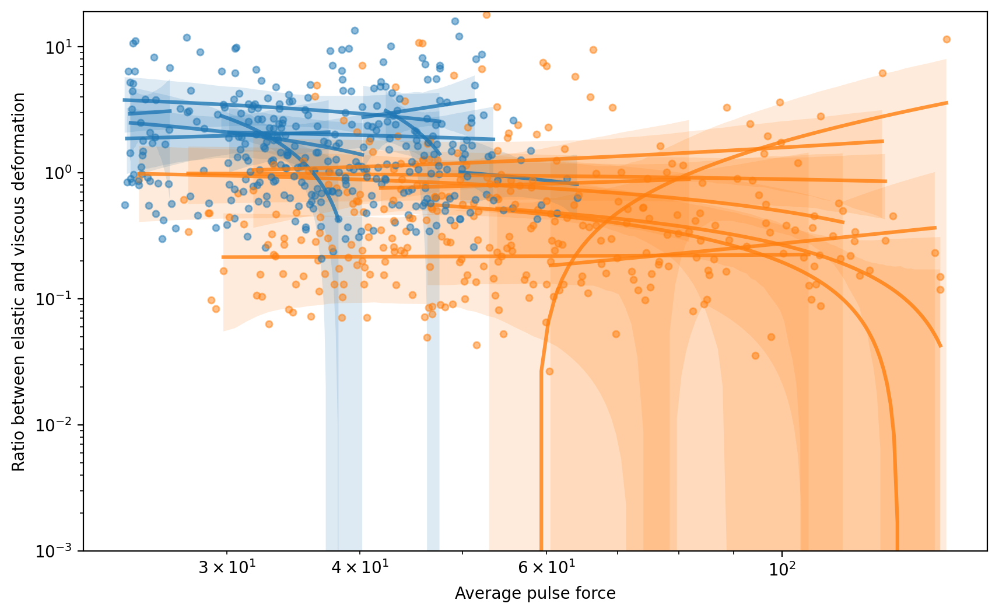

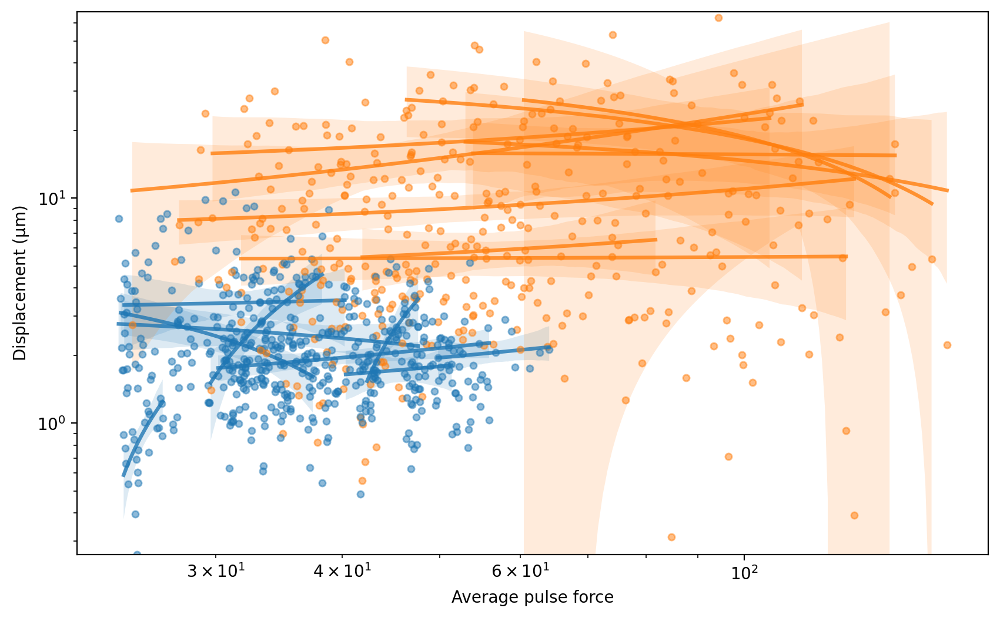

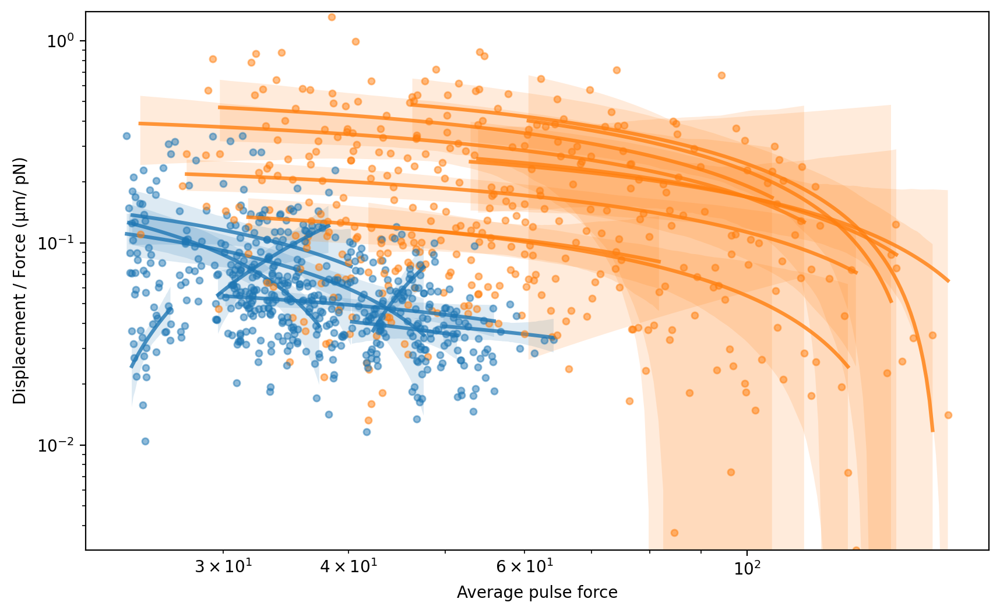

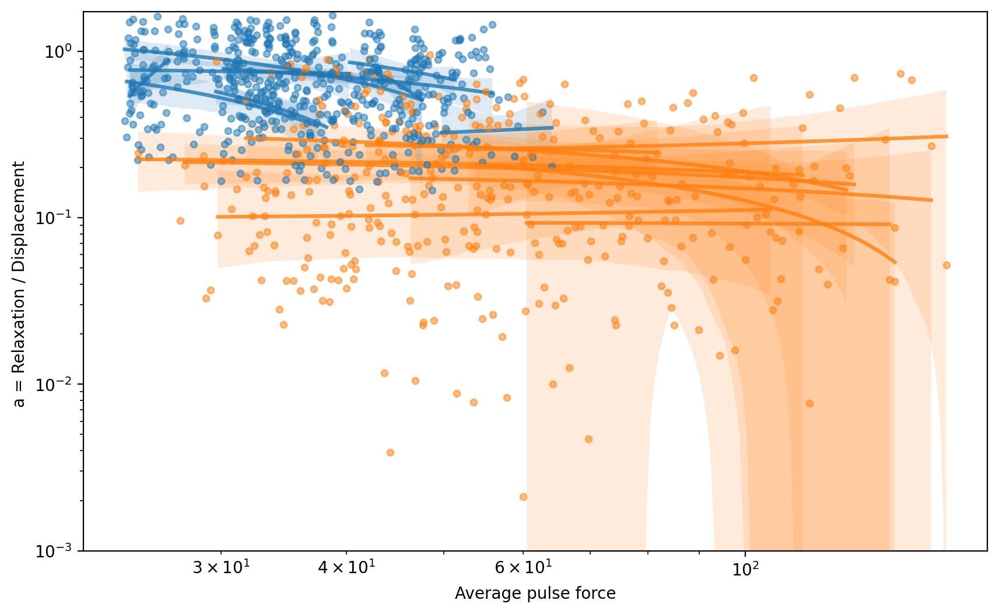

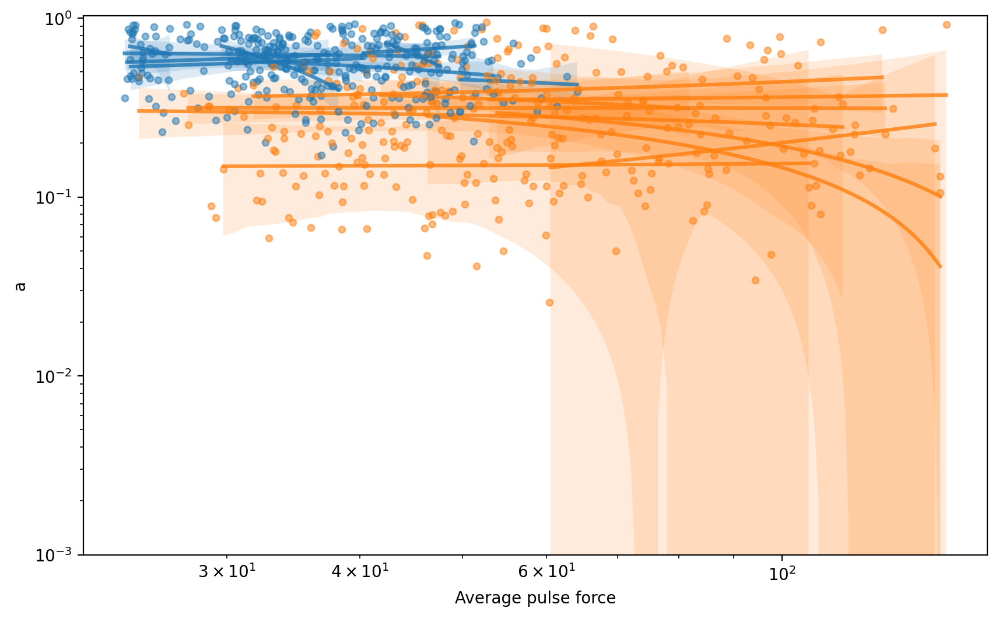

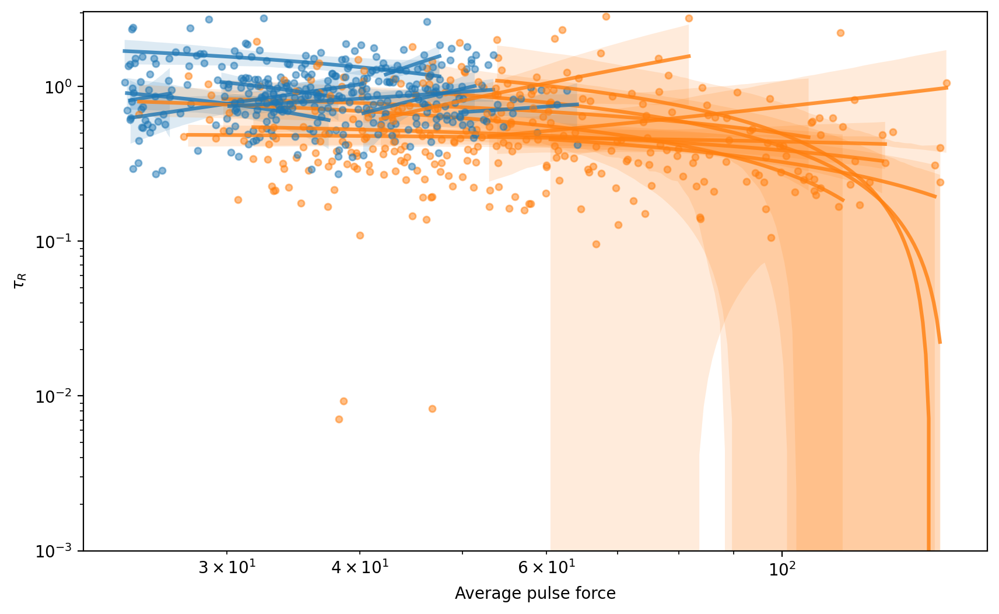

In [119]:
rng = np.random.default_rng()

df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)
    fig = plt.figure(figsize=(10, 6), dpi=200)
    # plot all data
    for (i, embryo) in enumerate(df['EMBRYO'].unique()):
        plt.plot(df.loc[(df['MT_STATUS']=='n')&(df['EMBRYO']==embryo), 'AVG_FORCE'], df.loc[(df_results_filtered['MT_STATUS']=='n')&(df['EMBRYO']==embryo), param], 'o', color=sns.color_palette()[1], alpha=0.5, markersize = 4, label=embryo)
        plt.plot(df.loc[(df['MT_STATUS']=='y')&(df['EMBRYO']==embryo), 'AVG_FORCE'], df.loc[(df['MT_STATUS']=='y')&(df['EMBRYO']==embryo), param], 'o', color=sns.color_palette()[0], alpha=0.5, markersize = 4, label=embryo)
        
        if len(df[(df['MT_STATUS']=='y')&(df['EMBRYO']==embryo)].dropna()) > 0:
            sns.regplot(data=df[(df['MT_STATUS']=='y')&(df['EMBRYO']==embryo)], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[0], alpha=0.8))

        if len(df[(df['MT_STATUS']=='n')&(df['EMBRYO']==embryo)].dropna()) > 0:
            sns.regplot(data=df[(df['MT_STATUS']=='n')&(df['EMBRYO']==embryo)], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[1], alpha=0.8))
    
    plt.xlabel('Average pulse force')
    plt.ylabel(label)
    # plt.legend()
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

# Binned by the pulse number

There seems to be no significant trend in the measurements from repetitive pulses. Although, there is a slight change from teh first pulse to the rest. 

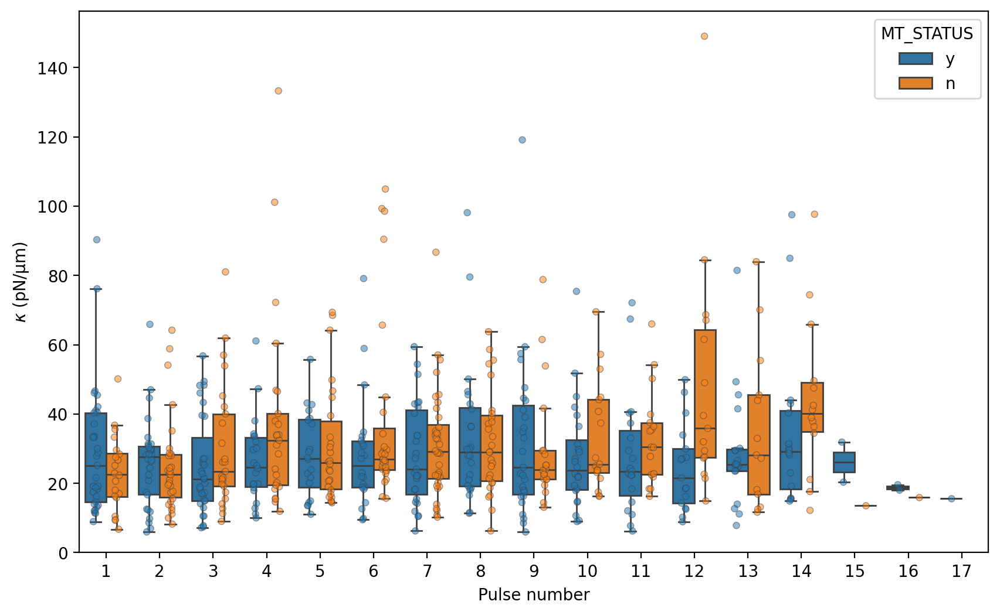

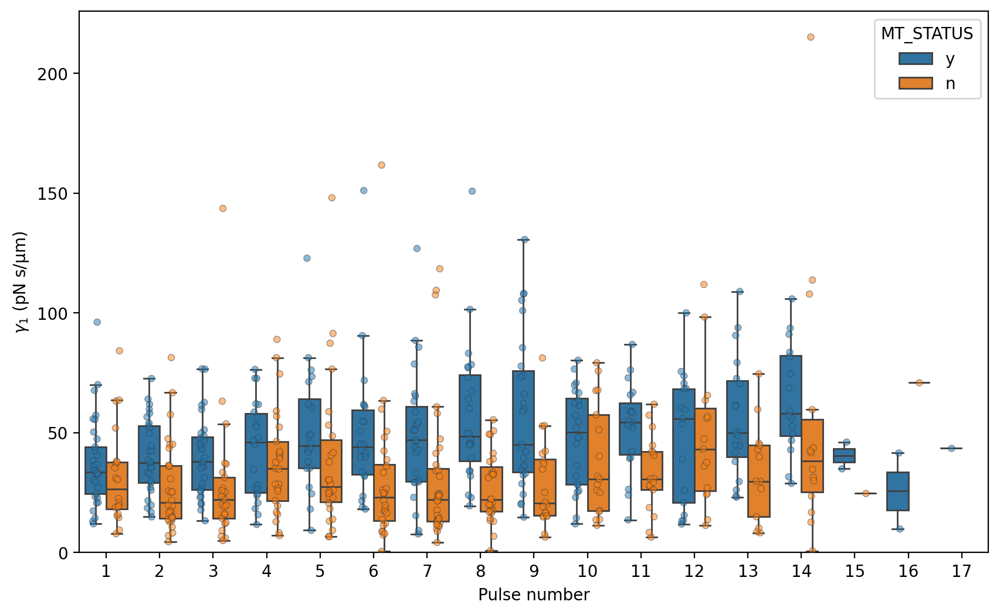

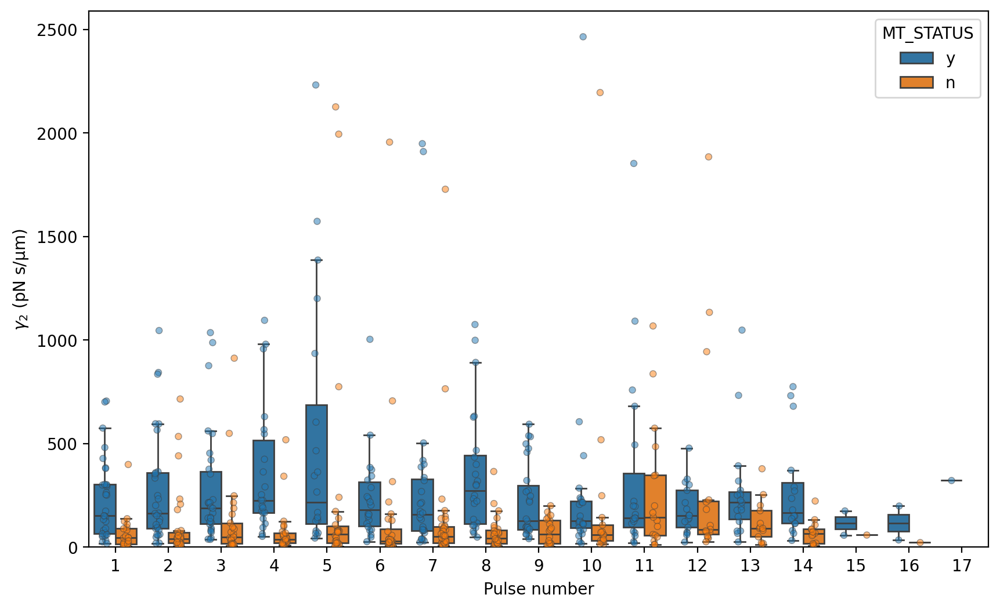

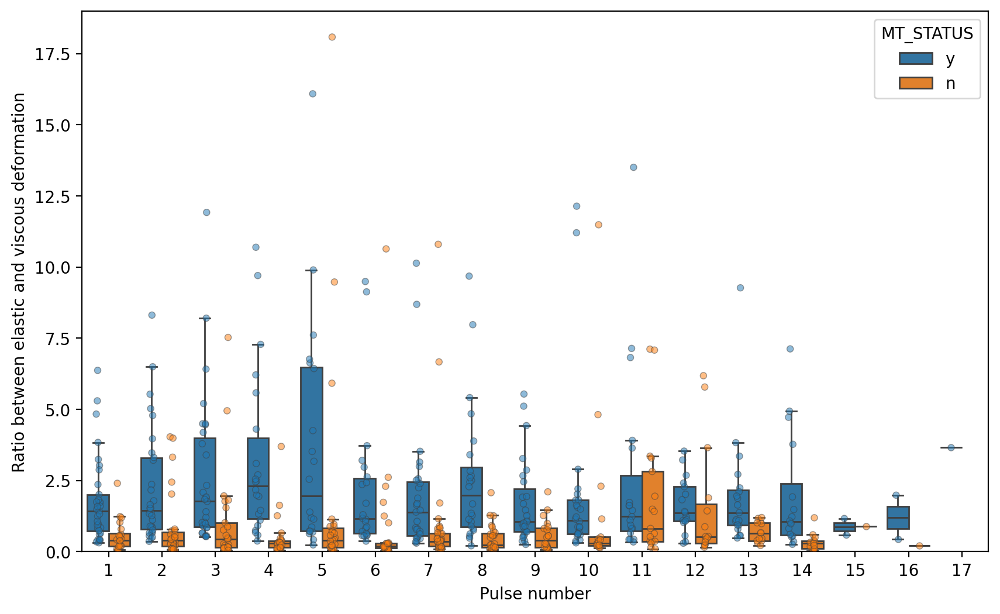

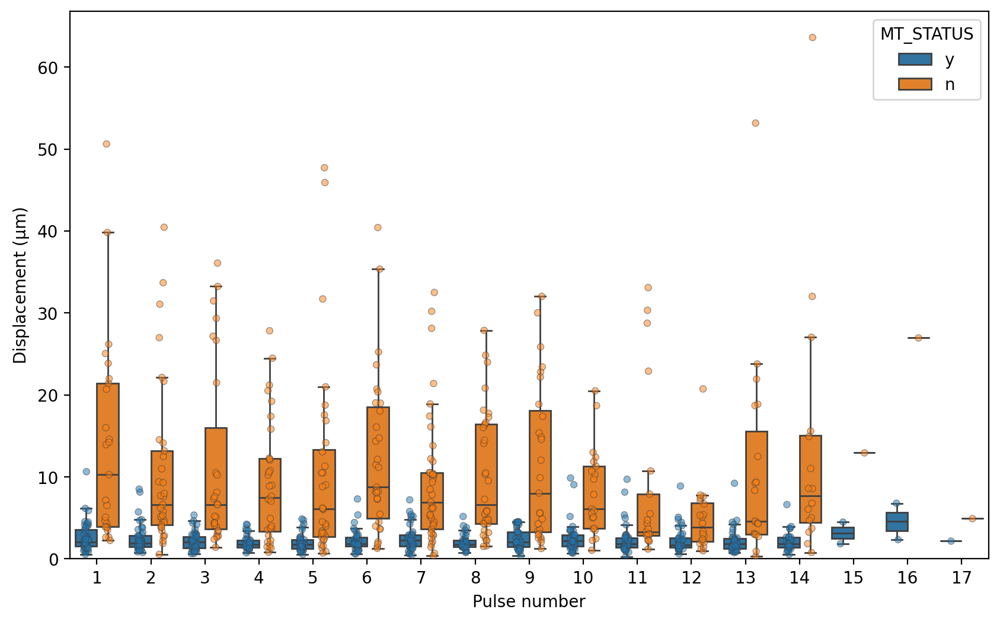

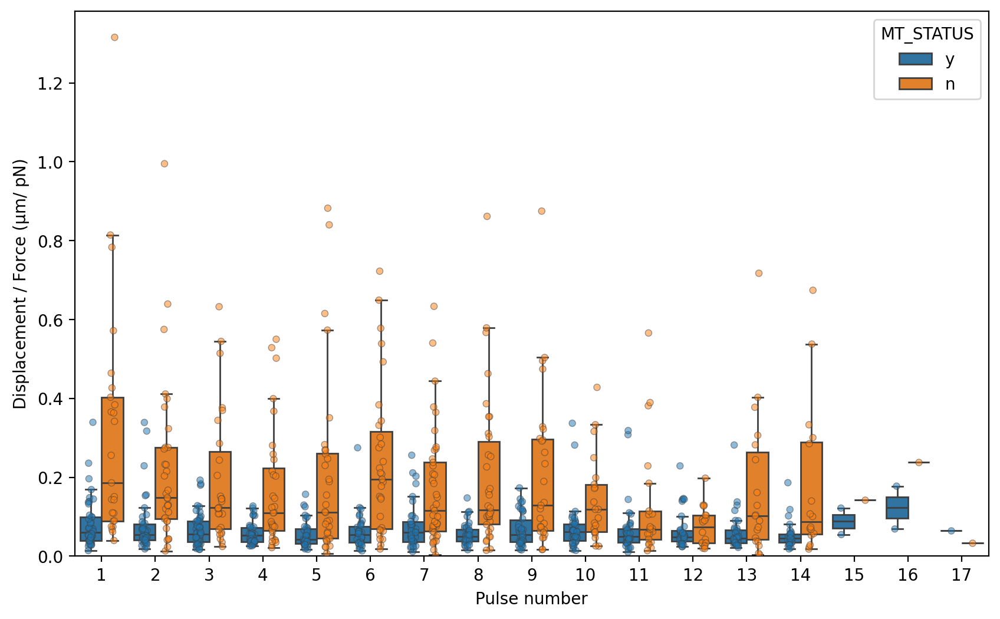

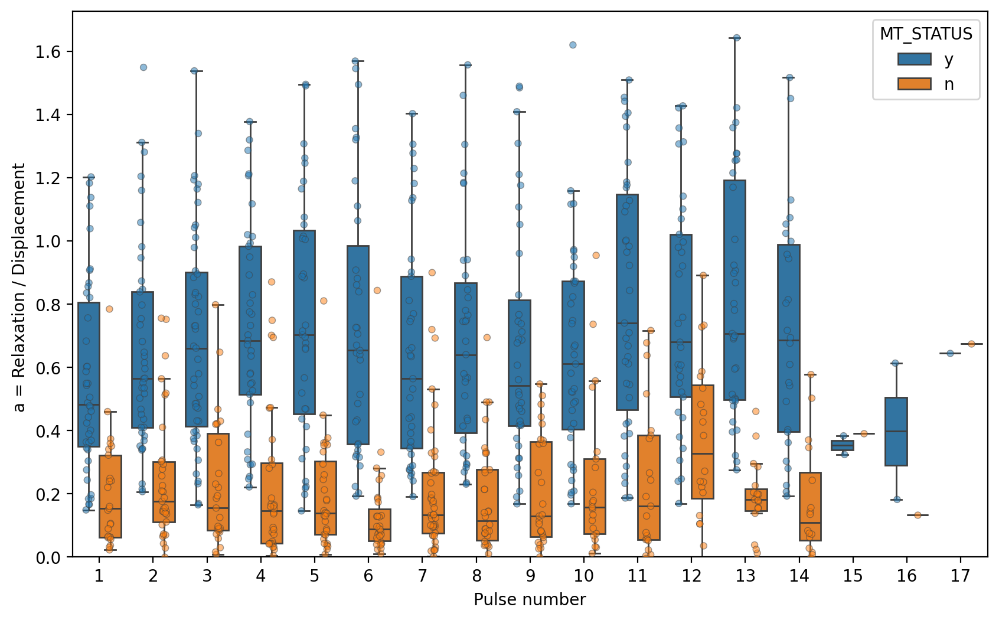

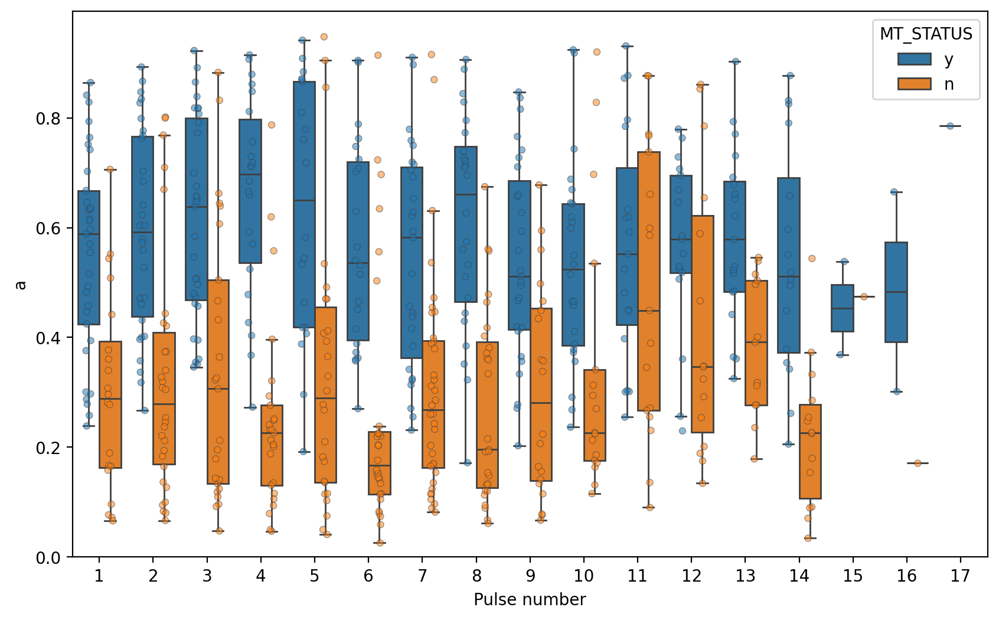

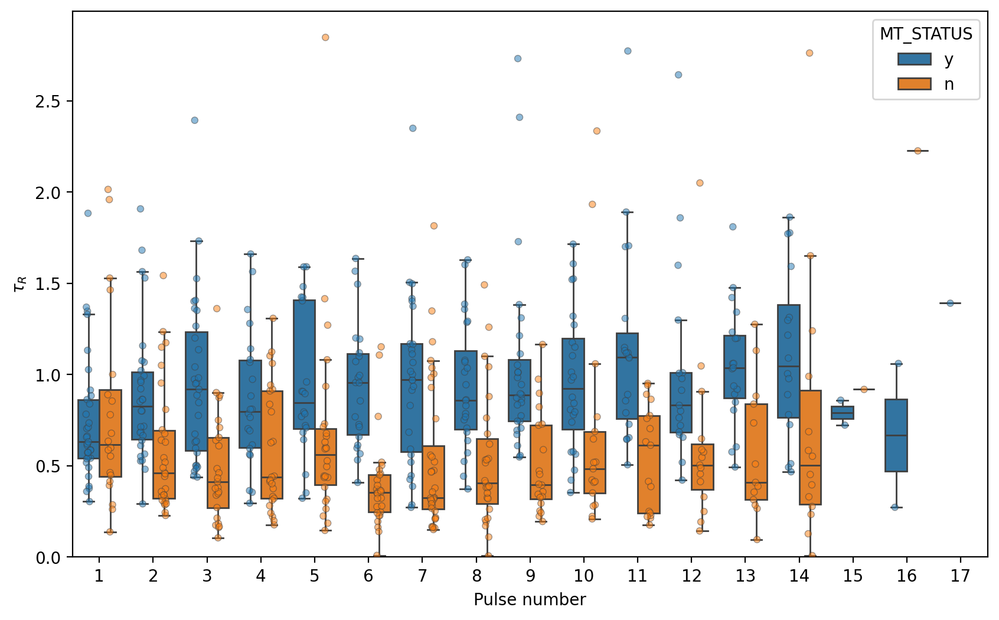

In [120]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)
    fig = plt.figure(figsize=(10, 6), dpi=200)
    sns.boxplot(x='PULSE_NUMBER', y=param, hue='MT_STATUS', data=df, fliersize=0)
    sns.stripplot(x='PULSE_NUMBER', y=param, hue='MT_STATUS', data=df, dodge=True, jitter=True, alpha=0.5, linewidth=0.5, legend=False, size=4)
    plt.xlabel('Pulse number')
    plt.ylabel(label)
    plt.ylim(bottom=0)

    plt.show()